In [1]:
import torch
import json
import numpy
from sklearn.preprocessing import MinMaxScaler
import shap
import sys
import time
import pandas as pd
import os
import re

In [2]:
def atoi(text):
    return int(text) if text.isdigit() else text
def natural_keys(text):
    '''
    alist.sort(key=natural_keys) sorts in human order
    http://nedbatchelder.com/blog/200712/human_sorting.html
    (See Toothy's implementation in the comments)
    '''
    return [ atoi(c) for c in re.split(r'(\d+)', text) ]

In [3]:
def load_dataset(path, dataset):
    with open(path + dataset + "_TRAIN.npy", 'rb') as f:
        train = numpy.load(f, allow_pickle=True)
    print("Train shape:", train.shape)
    with open(path + dataset + "_TEST.npy", 'rb') as f:
        test = numpy.load(f, allow_pickle=True)
    print("Test shape:", test.shape)
    #scaling
    scaler = MinMaxScaler()
    train = scaler.fit_transform(train.reshape(-1,train.shape[-1])).reshape(train.shape)
    test = scaler.fit_transform(test.reshape(-1,test.shape[-1])).reshape(test.shape)
    return train, test

In [4]:
def load_cluster_labels(path, cluster_labels):
    print("Silhouette Score:", cluster_labels.split('SilhouetteScore_')[1].split('_')[0])
    cluster_labels = numpy.load(path + cluster_labels)
    print("Number of clusters:", len(set(cluster_labels)))
    print("Clusters:", set(cluster_labels))
    print("Cluster Labels:",cluster_labels)
    return cluster_labels

In [5]:
def get_data_per_cluster(cluster_indices, data, print_=False):
    cluster_data = numpy.array([])
    count = 0
    for i in cluster_indices:
        sample = data[i].reshape(1, data.shape[1])
        # reshape to (x, 1)
        sample = sample.reshape(1, sample.shape[1])
        if print_:
            print(sample.shape)
        if count == 0:
            cluster_data = sample
        else:
            cluster_data = numpy.append(cluster_data, sample, axis=0) 
        count = count + 1
    if print_:
        print(cluster_data.shape)
    return cluster_data

In [6]:
def get_anomaly_cluster_association(cluster_labels, cluster):
    # get position (index) of each anomaly belonging to a cluster
    cluster_indices = [index for index, value in enumerate(cluster_labels) if value == cluster]
    print(len(cluster_indices),"samples in cluster", cluster)
    return cluster_indices

In [7]:
def get_plots_per_sample_within_cluster(cluster_indices, shap_values, sample_values, features):
    for i in cluster_indices:
        print("Sample:",i)
        shap_values_sample = shap_values[i].reshape(1, shap_values.shape[1])
        sample = sample_values[i].reshape(1, sample_values.shape[1])
        shap.summary_plot(shap_values_sample, sample, feature_names=features, max_display=20)

## Features

In [8]:
df = pd.read_csv("/home/sto2/storage_data/df_actualAnomalies_reducedFeatures_sergeValidated.csv")
df.drop(['Unnamed: 0'],axis=1,inplace=True)
df.drop(['systemid','instanceid'], axis=1, inplace=True)
features = df.columns[2:].to_list()

source_path = "/home/sto2/0-final_storageData_arrays/"
all_files = os.listdir(source_path)
counter = 1
features_order_in_data = []
for file in sorted(all_files):
    dimension_number = int(re.findall(r'\d+', file)[0])
    print(file, features[dimension_number-1])
    features_order_in_data.append(features[dimension_number-1])
    counter+=1

df_actualAnomalies_reducedFeatures_sergeValidatedDimension1.npy Read Cache Hits - VCC (%)
df_actualAnomalies_reducedFeatures_sergeValidatedDimension10.npy Overall Back-end Response Time (ms/op)
df_actualAnomalies_reducedFeatures_sergeValidatedDimension11.npy Back-end Read Queue Time (ms/op)
df_actualAnomalies_reducedFeatures_sergeValidatedDimension12.npy Back-end Write Queue Time (ms/op)
df_actualAnomalies_reducedFeatures_sergeValidatedDimension13.npy Back-end Read Transfer Size (KiB/op)
df_actualAnomalies_reducedFeatures_sergeValidatedDimension14.npy Back-end Write Transfer Size (KiB/op)
df_actualAnomalies_reducedFeatures_sergeValidatedDimension15.npy Read I/O Rate - overall (ops/s)
df_actualAnomalies_reducedFeatures_sergeValidatedDimension16.npy Write I/O Rate - overall (ops/s)
df_actualAnomalies_reducedFeatures_sergeValidatedDimension17.npy Peak Back-end Read Response Time (ms)
df_actualAnomalies_reducedFeatures_sergeValidatedDimension18.npy Port Send Data Rate (MiB/s)
df_actualAnom

In [9]:
features_order_in_data

['Read Cache Hits - VCC (%)',
 'Overall Back-end Response Time (ms/op)',
 'Back-end Read Queue Time (ms/op)',
 'Back-end Write Queue Time (ms/op)',
 'Back-end Read Transfer Size (KiB/op)',
 'Back-end Write Transfer Size (KiB/op)',
 'Read I/O Rate - overall (ops/s)',
 'Write I/O Rate - overall (ops/s)',
 'Peak Back-end Read Response Time (ms)',
 'Port Send Data Rate (MiB/s)',
 'Write Data Rate (MiB/s)',
 'Read Cache Hits - VC (%)',
 'Read Response Time (ms/op)',
 'Write Response Time (ms/op)',
 'Port Receive Data Rate (MiB/s)',
 'Overall Response Time (ms/op)',
 'Read Transfer Size (KiB/op)',
 'Write Transfer Size (KiB/op)',
 'Port Send I/O Rate (ops/s)',
 'Total Cache Hits - VCC (%)',
 'Total Cache Hits - VC (%)',
 'Port to Host Send I/O Rate (ops/s)',
 'Write Cache Hits - VCC (%)',
 'Port to Disk Send I/O Rate (ops/s)',
 'Port to Disk Receive I/O Rate (ops/s)',
 'Port to Local Node Send I/O Rate (ops/s)',
 'Port to Remote Node Send I/O Rate (ops/s)',
 'Port to Disk Send Data Rate (MiB

## Paths

In [10]:
data_path = '/home/sto/Data/0-actualAnomalies_reducedFeatures_sergeValidated_ZERO/'
dataset = '0-df_actualAnomalies_reducedFeatures_sergeValidated'

In [11]:
shap_values_path = '/home/sto/Data/0-SHAP/00wholeSet_clustersSeparated_May3/cluster_0_59_samples_noResponseTime/'

In [12]:
cluster_indices_path = '/home/sto/Notebooks/0-SHAP_cluster_0_59_samples_NORESPONSETIME_silhouetteScore_0.8633223762692354_MAY03Results.npy'

## Dataset

In [13]:
train, test = load_dataset(data_path, dataset)

Train shape: (66, 84, 1113)
Test shape: (17, 84, 1113)


In [14]:
dataset = numpy.concatenate((train,test))
print(dataset.shape)

(83, 84, 1113)


In [15]:
number_anomalies = dataset.shape[0]
number_anomalies

83

## Shap Values

In [16]:
all_files = os.listdir(shap_values_path)
all_files.sort(key=natural_keys)
shap_values = []
for file in all_files:
    if 'shap-values' in file:
        print(file)
        array = numpy.load(shap_values_path + file)
        shap_values.append(array)
print(len(shap_values))

shap-values_all-anomalies_samples-to-explain_59_CLUSTER_background-data_25_noResponseTime_Anomaly__0Cluster_.npy
shap-values_all-anomalies_samples-to-explain_59_CLUSTER_background-data_25_noResponseTime_Anomaly__2Cluster_.npy
shap-values_all-anomalies_samples-to-explain_59_CLUSTER_background-data_25_noResponseTime_Anomaly__3Cluster_.npy
shap-values_all-anomalies_samples-to-explain_59_CLUSTER_background-data_25_noResponseTime_Anomaly__4Cluster_.npy
shap-values_all-anomalies_samples-to-explain_59_CLUSTER_background-data_25_noResponseTime_Anomaly__5Cluster_.npy
shap-values_all-anomalies_samples-to-explain_59_CLUSTER_background-data_25_noResponseTime_Anomaly__6Cluster_.npy
shap-values_all-anomalies_samples-to-explain_59_CLUSTER_background-data_25_noResponseTime_Anomaly__7Cluster_.npy
shap-values_all-anomalies_samples-to-explain_59_CLUSTER_background-data_25_noResponseTime_Anomaly__8Cluster_.npy
shap-values_all-anomalies_samples-to-explain_59_CLUSTER_background-data_25_noResponseTime_Anomal

In [17]:
shap_values = numpy.concatenate(shap_values, axis=0 )
print(shap_values.shape)
print(shap_values)

(59, 84, 1113)
[[[ 3.88978285e-13  5.13595503e-11  3.92508593e-10 ... -4.70115469e-06
   -3.63823217e-06 -5.58073365e-06]
  [ 5.24901122e-10 -8.07898607e-08  8.73208175e-10 ... -1.58858597e-08
   -1.89942429e-08 -1.67106612e-08]
  [-4.05530965e-15 -3.68540375e-13 -4.53955403e-13 ...  0.00000000e+00
    0.00000000e+00  0.00000000e+00]
  ...
  [ 1.89202614e-11  3.10360097e-09  6.14106257e-10 ... -6.20307862e-06
   -6.26228575e-06 -6.60236740e-06]
  [ 1.96879474e-11 -1.93121593e-07 -8.85947652e-08 ... -1.41766676e-06
   -1.89067284e-06 -1.09300315e-06]
  [-5.62772309e-12  1.40441118e-10 -1.37344595e-10 ... -2.01694794e-08
   -2.29958523e-08 -1.97203708e-08]]

 [[-1.07055640e-12  1.51973927e-09 -6.61452376e-10 ... -4.70115469e-06
   -3.63823217e-06 -5.58073365e-06]
  [-7.46156870e-09  1.14901468e-07  2.98253520e-08 ... -1.58858597e-08
   -1.89942430e-08 -1.67106612e-08]
  [ 2.61437924e-14 -3.68540375e-13 -4.53955403e-13 ...  0.00000000e+00
    0.00000000e+00  0.00000000e+00]
  ...
  [-5.54

## Lengths of Anomalies

In [18]:
cluster_indices = numpy.load(cluster_indices_path)
cluster_indices

array([ 0,  2,  3,  4,  5,  6,  7,  8,  9, 11, 12, 14, 15, 16, 17, 19, 20,
       21, 23, 24, 26, 28, 29, 32, 34, 35, 37, 38, 39, 40, 41, 42, 44, 45,
       46, 47, 48, 49, 50, 52, 53, 55, 56, 57, 59, 60, 61, 62, 63, 64, 65,
       67, 68, 69, 72, 74, 76, 78, 80])

In [19]:
anomalies_length = numpy.load("/home/sto/Data/0-actualAnomalies_reducedFeatures_sergeValidated/anomalies_length.npy")
cluster_anomalies_length = []
for i in cluster_indices:
    cluster_anomalies_length.append(anomalies_length[i])
print(len(cluster_anomalies_length))
print(cluster_anomalies_length)

59
[30, 319, 27, 66, 74, 961, 121, 95, 26, 276, 673, 380, 91, 591, 157, 77, 214, 263, 125, 371, 458, 205, 81, 514, 425, 35, 283, 470, 370, 1113, 302, 291, 429, 32, 298, 26, 421, 101, 126, 301, 233, 724, 31, 113, 614, 867, 30, 69, 42, 372, 317, 41, 81, 157, 179, 115, 149, 87, 49]


In [20]:
print(numpy.amin(cluster_anomalies_length))
print(numpy.amax(cluster_anomalies_length))

26
1113


## Cut Shap Values to Lengths of Anomalies

In [21]:
new_shap_values = []
for i in range(0,59):
    feature_array = []
    length = cluster_anomalies_length[i]
    print("Anomaly #", i+1, "Length:", length)
    for x in range(0,84):
        print("Dimensions #",x+1)
        print(shap_values[i][x])
        print(shap_values[i][x].shape[0])
        new_anomaly = shap_values[i][x][:length]
        print(new_anomaly.shape[0])
        val_pad = 1113 - new_anomaly.shape[0]
        if val_pad != 0:
            new_anomaly = numpy.pad(new_anomaly, (0, val_pad), 'constant', constant_values=(numpy.nan))
        feature_array.append(new_anomaly)
    new_shap_values.append(feature_array)
    print("#####################################################")
new_shap_values = numpy.array(new_shap_values)

Anomaly # 1 Length: 30
Dimensions # 1
[ 3.88978285e-13  5.13595503e-11  3.92508593e-10 ... -4.70115469e-06
 -3.63823217e-06 -5.58073365e-06]
1113
30
Dimensions # 2
[ 5.24901122e-10 -8.07898607e-08  8.73208175e-10 ... -1.58858597e-08
 -1.89942429e-08 -1.67106612e-08]
1113
30
Dimensions # 3
[-4.05530965e-15 -3.68540375e-13 -4.53955403e-13 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
30
Dimensions # 4
[-9.93833331e-16  4.79535532e-13  1.17417643e-11 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
30
Dimensions # 5
[-3.28606499e-08 -2.90685812e-06 -1.42426590e-06 ... -6.02279634e-06
 -4.58671248e-06 -5.53824409e-06]
1113
30
Dimensions # 6
[-8.77910929e-11 -3.06581398e-08 -2.81108984e-08 ... -2.12825177e-05
 -1.29884566e-05 -1.84164898e-05]
1113
30
Dimensions # 7
[ 4.92776715e-08 -9.73774543e-06 -2.76630087e-06 ... -6.82796542e-04
 -1.00555718e-03 -7.71933371e-04]
1113
30
Dimensions # 8
[ 4.32279001e-08 -2.06440620e-05  3.13321063e-06 ... -9.03802668e-03
 -7.7833649

1113
27
Dimensions # 55
[0. 0. 0. ... 0. 0. 0.]
1113
27
Dimensions # 56
[-4.05319530e-08 -2.50497514e-06 -2.21376922e-08 ... -3.24716795e-04
 -3.36472812e-04 -3.14629402e-04]
1113
27
Dimensions # 57
[0. 0. 0. ... 0. 0. 0.]
1113
27
Dimensions # 58
[0. 0. 0. ... 0. 0. 0.]
1113
27
Dimensions # 59
[0. 0. 0. ... 0. 0. 0.]
1113
27
Dimensions # 60
[ 4.71818743e-08  9.14013591e-07  2.90548339e-07 ... -7.95224384e-02
 -7.95224365e-02 -7.95224387e-02]
1113
27
Dimensions # 61
[ 8.92759061e-08  1.08515631e-07 -1.38475640e-06 ... -6.38021619e-04
 -5.12776349e-04 -3.46936598e-04]
1113
27
Dimensions # 62
[-4.50099320e-10  7.91121699e-07 -9.41156214e-08 ... -2.97769410e-04
 -3.26838353e-04 -1.95561065e-04]
1113
27
Dimensions # 63
[-3.95597276e-09 -6.63918913e-06 -8.08943026e-06 ... -4.17868250e-05
 -4.32642968e-05 -7.97055201e-05]
1113
27
Dimensions # 64
[ 5.53966901e-07  4.80205089e-05  4.64321808e-05 ... -9.76503747e-04
 -1.46629477e-03 -1.64375502e-03]
1113
27
Dimensions # 65
[-6.73346739e-10 -1.83

961
Dimensions # 32
[0. 0. 0. ... 0. 0. 0.]
1113
961
Dimensions # 33
[ 9.85528395e-12  6.31581690e-11  1.06133594e-10 ... -1.23329684e-09
 -1.66555469e-09 -1.49376154e-09]
1113
961
Dimensions # 34
[ 7.18492540e-07  4.35782079e-05  5.14042724e-05 ... -5.03941209e-02
 -6.96129730e-02 -5.67613353e-02]
1113
961
Dimensions # 35
[-7.01418906e-14 -5.87970569e-12 -5.41777589e-12 ... -2.26562835e-09
 -3.01969323e-09 -2.45111031e-09]
1113
961
Dimensions # 36
[-8.84934530e-13 -1.87498425e-08 -5.11029991e-11 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
961
Dimensions # 37
[ 0.00000000e+00 -1.17982133e-11  0.00000000e+00 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
961
Dimensions # 38
[0.00000000e+00 2.69287361e-09 0.00000000e+00 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
961
Dimensions # 39
[ 5.38247411e-08 -3.56871706e-05  4.47982117e-06 ... -4.16229218e-05
 -1.79969742e-04 -1.98572635e-05]
1113
961
Dimensions # 40
[ 1.55251464e-07 -5.17340283e-07  2.33150

26
Dimensions # 2
[ 2.20597843e-09  1.58328736e-07  3.88536101e-08 ... -1.58858597e-08
 -1.89942427e-08 -1.67106612e-08]
1113
26
Dimensions # 3
[-4.05530966e-15 -3.68540376e-13 -4.53955403e-13 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
26
Dimensions # 4
[-9.93833332e-16  4.79535532e-13  1.17417643e-11 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
26
Dimensions # 5
[-2.62202351e-08 -7.37335417e-07 -8.05505254e-07 ... -6.02279634e-06
 -4.58671247e-06 -5.53824409e-06]
1113
26
Dimensions # 6
[ 3.21432081e-10 -1.06138139e-08 -3.61783917e-09 ... -2.12825177e-05
 -1.29884566e-05 -1.84164898e-05]
1113
26
Dimensions # 7
[-1.28547238e-07 -8.11004484e-06 -2.25228304e-06 ... -6.82796542e-04
 -1.00555718e-03 -7.71933371e-04]
1113
26
Dimensions # 8
[-5.04448420e-07 -5.67132181e-05 -1.63857050e-05 ... -9.03802668e-03
 -7.78336490e-03 -8.98987735e-03]
1113
26
Dimensions # 9
[-1.40382852e-10 -4.63806293e-08 -4.21677445e-09 ... -2.39993931e-05
 -1.49255425e-04 -1.56301917e-0

 -5.71708575e-08 -1.14470585e-07]
1113
673
Dimensions # 67
[-3.23159256e-08 -2.08992469e-06 -1.00524712e-06 ... -1.95778190e-04
 -1.49941039e-04 -1.85730542e-04]
1113
673
Dimensions # 68
[ 4.68360619e-10  4.84823695e-08  1.27395432e-09 ... -4.64741644e-08
 -5.29298555e-08 -7.34227889e-08]
1113
673
Dimensions # 69
[-3.16618840e-12  1.81801223e-09 -7.85499582e-10 ... -5.74226597e-09
 -6.02929240e-09 -2.34000744e-08]
1113
673
Dimensions # 70
[ 1.01576716e-10  9.40754769e-09  2.14379370e-08 ... -5.24703603e-09
 -3.81116295e-09 -1.04581537e-08]
1113
673
Dimensions # 71
[-9.18573083e-12 -6.06479060e-10 -6.37259673e-10 ... -2.61584193e-08
 -2.25025527e-08 -3.07804381e-08]
1113
673
Dimensions # 72
[-3.61608266e-11  9.34179596e-09 -6.32257352e-10 ... -1.13392691e-08
 -1.16484749e-08 -1.13632541e-08]
1113
673
Dimensions # 73
[ 3.24081654e-12  9.04558998e-09  2.59314935e-10 ... -4.66908829e-07
 -3.92038949e-07 -4.11366157e-07]
1113
673
Dimensions # 74
[ 1.14953052e-10 -3.58047960e-07  7.20653166e

Dimensions # 49
[-4.65393081e-15 -4.93476657e-11 -1.00158881e-11 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
591
Dimensions # 50
[-6.54204160e-09 -5.37544195e-07 -1.80489098e-07 ... -7.59846004e-06
 -8.88042154e-06 -7.79043349e-06]
1113
591
Dimensions # 51
[-8.78416937e-11 -3.86960209e-09 -5.09064776e-09 ... -2.27270319e-08
 -2.71181273e-08 -2.41416733e-08]
1113
591
Dimensions # 52
[ 7.81691571e-13  8.64893388e-11  4.62622944e-12 ... -1.54739098e-09
 -1.96721966e-09 -1.81766111e-09]
1113
591
Dimensions # 53
[ 0.00000000e+00 -4.45496802e-14  0.00000000e+00 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
591
Dimensions # 54
[0.00000000e+00 3.01019733e-11 0.00000000e+00 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
591
Dimensions # 55
[0. 0. 0. ... 0. 0. 0.]
1113
591
Dimensions # 56
[-1.05697524e-07 -3.50921281e-06 -9.98828050e-09 ... -3.24716795e-04
 -3.36472812e-04 -3.14629402e-04]
1113
591
Dimensions # 57
[0. 0. 0. ... 0. 0. 0.]
1113
591
Dimensions #

214
Dimensions # 27
[-9.08194875e-10 -6.84734655e-08 -7.97139648e-07 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
214
Dimensions # 28
[3.75116382e-10 1.91868942e-08 8.79445308e-08 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
214
Dimensions # 29
[1.39816454e-09 1.34347873e-07 3.70863903e-07 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
214
Dimensions # 30
[1.12605531e-09 1.01850349e-07 1.45210668e-07 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
214
Dimensions # 31
[ 3.11783917e-12 -1.86559242e-11 -1.02060795e-11 ...  2.39520965e-10
  2.33591182e-10  2.40238293e-10]
1113
214
Dimensions # 32
[0. 0. 0. ... 0. 0. 0.]
1113
214
Dimensions # 33
[ 9.85528395e-12  2.13536108e-10  7.96000968e-11 ... -1.23329684e-09
 -1.66555469e-09 -1.49376154e-09]
1113
214
Dimensions # 34
[ 6.10574275e-07  4.71989837e-05  7.62391200e-05 ... -5.03941209e-02
 -6.96129730e-02 -5.67613353e-02]
1113
214
Dimensions # 35
[-9.29152134e-14 -9.00697940e-12 -5.41777588e-12 ... 

125
#####################################################
Anomaly # 20 Length: 371
Dimensions # 1
[-7.94630969e-13 -1.25202867e-09 -1.71667015e-10 ... -4.70115469e-06
 -3.63823217e-06 -5.58073365e-06]
1113
371
Dimensions # 2
[ 4.99652758e-10 -1.25896018e-07 -3.59915194e-08 ... -1.58858597e-08
 -1.89942430e-08 -1.67106612e-08]
1113
371
Dimensions # 3
[-4.05530967e-15 -1.43827148e-13 -4.53955403e-13 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
371
Dimensions # 4
[-9.93833325e-16  4.79535532e-13 -1.78402312e-11 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
371
Dimensions # 5
[ 4.12048141e-09  9.96170879e-07  7.37238964e-07 ... -6.02279634e-06
 -4.58671248e-06 -5.53824409e-06]
1113
371
Dimensions # 6
[-6.22065777e-11 -1.44366507e-08  4.88301852e-09 ... -2.12825177e-05
 -1.29884566e-05 -1.84164898e-05]
1113
371
Dimensions # 7
[ 2.10236664e-07 -6.90416995e-06 -2.95011396e-06 ... -6.82796542e-04
 -1.00555718e-03 -7.71933371e-04]
1113
371
Dimensions # 8
[ 3.85339022e

 -5.71708575e-08 -1.14470585e-07]
1113
205
Dimensions # 67
[ 1.93878885e-08  1.61230614e-06  1.19505408e-06 ... -1.95778190e-04
 -1.49941039e-04 -1.85730542e-04]
1113
205
Dimensions # 68
[ 1.73723603e-10  8.93767324e-08  1.38546294e-09 ... -4.64741644e-08
 -5.29298555e-08 -7.34227890e-08]
1113
205
Dimensions # 69
[-3.11868734e-12 -5.21413425e-10 -7.41697796e-10 ... -5.74226599e-09
 -6.02929212e-09 -2.34000743e-08]
1113
205
Dimensions # 70
[ 9.11534213e-11 -2.30776025e-08  3.38823534e-09 ... -5.24703603e-09
 -3.81116289e-09 -1.04581537e-08]
1113
205
Dimensions # 71
[-2.78803949e-12 -5.99102507e-10 -1.75233873e-10 ... -2.61584193e-08
 -2.25025528e-08 -3.07804381e-08]
1113
205
Dimensions # 72
[ 1.23809866e-10  4.65838381e-09  5.76542130e-09 ... -1.13392691e-08
 -1.16484748e-08 -1.13632541e-08]
1113
205
Dimensions # 73
[-6.30056305e-12 -2.75757613e-09 -1.36792973e-09 ... -4.66908829e-07
 -3.92038951e-07 -4.11366157e-07]
1113
205
Dimensions # 74
[ 1.12083381e-09  1.76039038e-07  4.07194569e

  0.00000000e+00  0.00000000e+00]
1113
425
Dimensions # 42
[ 5.45327205e-10  1.98562939e-07  7.10753366e-08 ... -9.40893173e-07
 -7.36851236e-07 -9.65355524e-07]
1113
425
Dimensions # 43
[-1.03321506e-09 -5.20895575e-08 -2.40167896e-09 ... -8.14077065e-05
 -2.24666839e-04 -1.37215296e-05]
1113
425
Dimensions # 44
[-7.14183023e-06 -4.10797856e-02 -1.12755310e-01 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
425
Dimensions # 45
[ 1.10577044e-08 -1.02516314e-06  3.90651982e-07 ... -7.08480146e-03
 -8.54354331e-03 -8.18208632e-03]
1113
425
Dimensions # 46
[0. 0. 0. ... 0. 0. 0.]
1113
425
Dimensions # 47
[0. 0. 0. ... 0. 0. 0.]
1113
425
Dimensions # 48
[-1.11818050e-16  1.14619365e-10 -4.24937747e-11 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
425
Dimensions # 49
[-4.65393082e-15 -4.93476659e-11 -1.00158881e-11 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
425
Dimensions # 50
[-5.20755484e-09 -1.45991499e-07 -1.56354457e-07 ... -7.59846004e-06
 -8.88

[ 1.17459203e-11  1.23776717e-08  1.54497910e-10 ... -6.36697267e-06
 -6.42744422e-06 -6.77476011e-06]
1113
283
Dimensions # 81
[ 1.49490452e-10 -2.64408448e-09 -3.81625589e-10 ... -7.32970195e-07
 -1.81764595e-06 -6.69988071e-07]
1113
283
Dimensions # 82
[-1.69934773e-12  4.71996503e-10  4.67566186e-11 ... -6.46154023e-06
 -6.52321432e-06 -6.87746605e-06]
1113
283
Dimensions # 83
[-6.84636707e-12  1.26930269e-07  2.34974251e-08 ... -1.47673621e-06
 -1.96945088e-06 -1.13854495e-06]
1113
283
Dimensions # 84
[-1.81515623e-11  3.39729411e-09 -6.19049576e-10 ... -2.10098744e-08
 -2.39540129e-08 -2.05420530e-08]
1113
283
#####################################################
Anomaly # 28 Length: 470
Dimensions # 1
[-1.03063999e-12  9.22027591e-10  1.24302565e-09 ... -4.89703614e-06
 -3.78982518e-06 -5.81326422e-06]
1113
470
Dimensions # 2
[-2.26736512e-08  1.05339018e-07 -5.52796746e-08 ... -1.65477705e-08
 -1.97856696e-08 -1.74069387e-08]
1113
470
Dimensions # 3
[-2.06720219e-15 -3.83896223

Dimensions # 71
[-6.31136610e-12 -7.64221982e-10  1.10539638e-09 ...  5.33233586e-07
  4.67325171e-07  6.13648945e-07]
1113
1113
Dimensions # 72
[-5.95239883e-11  1.10449948e-08  3.38176286e-09 ...  2.51091312e-07
  2.57444753e-07  2.51584932e-07]
1113
1113
Dimensions # 73
[ 3.27923620e-13 -4.60142873e-10 -7.71060209e-10 ...  2.78775506e-06
  2.52152444e-06  2.59247239e-06]
1113
1113
Dimensions # 74
[-1.60462425e-09  1.21217298e-07  1.89319529e-08 ...  2.84504558e-06
  2.85927310e-06  2.93972074e-06]
1113
1113
Dimensions # 75
[-2.03093447e-09  5.59400759e-08  3.85372099e-08 ...  1.09634642e-07
  1.35607949e-07  1.65566377e-07]
1113
1113
Dimensions # 76
[-3.74730357e-09  1.18686702e-07  3.96050694e-08 ...  6.47584468e-06
  5.57847981e-06  4.77953084e-06]
1113
1113
Dimensions # 77
[-2.54671477e-15 -4.16544959e-13 -3.11587471e-13 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
1113
Dimensions # 78
[4.92216800e-10 1.11458443e-08 3.96176990e-11 ... 1.03969584e-07
 1.26902641e-07 

Dimensions # 51
[ 4.56149489e-12 -2.98018048e-09  3.34058806e-09 ... -2.36739915e-08
 -2.82480492e-08 -2.51475763e-08]
1113
429
Dimensions # 52
[ 8.14262054e-13  9.00930613e-11  4.81898900e-12 ... -1.61186560e-09
 -2.04918716e-09 -1.89339699e-09]
1113
429
Dimensions # 53
[ 0.00000000e+00 -4.64059173e-14  0.00000000e+00 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
429
Dimensions # 54
[0.00000000e+00 3.13562222e-11 0.00000000e+00 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
429
Dimensions # 55
[0. 0. 0. ... 0. 0. 0.]
1113
429
Dimensions # 56
[ 4.87989187e-08  9.74910520e-07 -3.94155144e-08 ... -3.38246662e-04
 -3.50492513e-04 -3.27738960e-04]
1113
429
Dimensions # 57
[0. 0. 0. ... 0. 0. 0.]
1113
429
Dimensions # 58
[0. 0. 0. ... 0. 0. 0.]
1113
429
Dimensions # 59
[0. 0. 0. ... 0. 0. 0.]
1113
429
Dimensions # 60
[ 1.24343557e-07  6.19778232e-06  1.86886077e-06 ... -8.28358734e-02
 -8.28358714e-02 -8.28358736e-02]
1113
429
Dimensions # 61
[ 1.03416123e-07  1.695925

 0.00000000e+00 0.00000000e+00]
1113
26
Dimensions # 39
[ 5.41482330e-08 -1.07229428e-05 -2.12834180e-06 ... -4.33572102e-05
 -1.87468482e-04 -2.06846495e-05]
1113
26
Dimensions # 40
[ 1.57801105e-07  5.53362944e-06  2.49292067e-06 ... -2.62437045e-04
 -4.88162604e-03 -3.67433712e-03]
1113
26
Dimensions # 41
[-1.93966620e-15 -5.22944215e-11 -2.96061316e-13 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
26
Dimensions # 42
[ 3.51722632e-10  6.62937591e-08 -1.03864149e-07 ... -9.80097055e-07
 -7.67553369e-07 -1.00557867e-06]
1113
26
Dimensions # 43
[-6.60812834e-10  6.35165257e-08  6.67945247e-11 ... -8.47996943e-05
 -2.34027957e-04 -1.42932600e-05]
1113
26
Dimensions # 44
[-7.43940649e-06 -4.27914433e-02 -1.17453448e-01 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
26
Dimensions # 45
[ 1.94547188e-09 -5.24472911e-07 -1.56643617e-07 ... -7.38000152e-03
 -8.89952428e-03 -8.52300658e-03]
1113
26
Dimensions # 46
[0. 0. 0. ... 0. 0. 0.]
1113
26
Dimensions # 47
[0. 0. 

 0.00000000e+00 0.00000000e+00]
1113
126
Dimensions # 20
[-1.31033076e-09  2.85260930e-10  7.73039833e-10 ... -8.03634995e-06
 -7.64071394e-06 -8.80983726e-06]
1113
126
Dimensions # 21
[-1.66810015e-09 -8.76721427e-08 -5.76781472e-10 ... -7.18182564e-06
 -5.95260781e-06 -6.95212924e-06]
1113
126
Dimensions # 22
[0. 0. 0. ... 0. 0. 0.]
1113
126
Dimensions # 23
[ 1.17503125e-15  4.85446474e-13  6.36994386e-14 ... -9.62975318e-06
 -9.72378672e-06 -1.02641163e-05]
1113
126
Dimensions # 24
[-6.07909269e-10 -1.50894481e-07 -1.08080549e-07 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
126
Dimensions # 25
[0. 0. 0. ... 0. 0. 0.]
1113
126
Dimensions # 26
[1.63043491e-07 4.04446225e-06 1.01335274e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
126
Dimensions # 27
[-9.46036329e-10 -7.13265267e-08 -8.30353800e-07 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
126
Dimensions # 28
[3.90746232e-10 1.99863482e-08 9.16088862e-08 ... 0.00000000e+00
 0.00000000e+00 0.

  0.00000000e+00  0.00000000e+00]
1113
724
Dimensions # 4
[-1.03524303e-15  4.99516179e-13  1.22310045e-11 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
724
Dimensions # 5
[-3.31600750e-08 -5.93468223e-06 -1.32819513e-06 ... -6.27374619e-06
 -4.77782550e-06 -5.76900426e-06]
1113
724
Dimensions # 6
[ 2.66374659e-09  1.07902795e-07  1.41082221e-07 ... -2.21692893e-05
 -1.35296423e-05 -1.91838435e-05]
1113
724
Dimensions # 7
[ 2.38311716e-08 -1.05842246e-05 -3.03253817e-06 ... -7.11246398e-04
 -1.04745539e-03 -8.04097262e-04]
1113
724
Dimensions # 8
[-1.83679142e-08  2.91527160e-05  3.41933594e-06 ... -9.41461112e-03
 -8.10767177e-03 -9.36445557e-03]
1113
724
Dimensions # 9
[ 5.76632760e-11 -4.41669579e-08 -2.87879138e-09 ... -2.49993679e-05
 -1.55474401e-04 -1.62814497e-05]
1113
724
Dimensions # 10
[-5.07905787e-08  2.37324956e-06  8.11884291e-07 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
724
Dimensions # 11
[-5.37745039e-08  7.57795621e-07 -1.20859755e-06 ..

Dimensions # 78
[-1.12625520e-09 -4.01627944e-09  9.60640419e-11 ... -7.02084961e-09
 -9.24265880e-09 -7.81816909e-09]
1113
113
Dimensions # 79
[-2.06272531e-11 -9.51588245e-10 -8.48512689e-10 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
113
Dimensions # 80
[ 1.17459203e-11 -5.09709726e-09  1.54497910e-10 ... -6.36697268e-06
 -6.42744423e-06 -6.77476012e-06]
1113
113
Dimensions # 81
[-8.47916640e-10  4.48278405e-09  3.22030502e-09 ... -7.32970195e-07
 -1.81764596e-06 -6.69988072e-07]
1113
113
Dimensions # 82
[-1.69934772e-12  3.60535879e-11  4.67566186e-11 ... -6.46154023e-06
 -6.52321432e-06 -6.87746605e-06]
1113
113
Dimensions # 83
[ 1.63393709e-11 -1.71338307e-07 -8.45333605e-08 ... -1.47673621e-06
 -1.96945087e-06 -1.13854495e-06]
1113
113
Dimensions # 84
[ 1.41584379e-12  2.36326339e-09  3.37393787e-10 ... -2.10098744e-08
 -2.39540128e-08 -2.05420530e-08]
1113
113
#####################################################
Anomaly # 45 Length: 614
Dimensions # 1
[ 3.201034

 -4.50669759e-05 -8.30265835e-05]
1113
30
Dimensions # 64
[ 9.16620650e-07  6.90496274e-05  1.00912290e-04 ... -1.01719140e-03
 -1.52739039e-03 -1.71224481e-03]
1113
30
Dimensions # 65
[-1.05139875e-09 -1.77383461e-07 -3.67482735e-07 ... -2.71008175e-04
 -1.46829396e-04 -1.84816358e-04]
1113
30
Dimensions # 66
[-4.19317584e-11 -6.42231902e-09 -7.43542335e-09 ... -1.10861844e-07
 -5.95529766e-08 -1.19240193e-07]
1113
30
Dimensions # 67
[ 1.89656277e-09 -2.88691780e-07 -6.75890726e-07 ... -2.03935615e-04
 -1.56188582e-04 -1.93469315e-04]
1113
30
Dimensions # 68
[ 1.00634308e-09  1.25273477e-07  1.18174875e-09 ... -4.84105879e-08
 -5.51352662e-08 -7.64820719e-08]
1113
30
Dimensions # 69
[ 3.83151064e-12  8.64844807e-11  4.53228612e-10 ... -5.98152707e-09
 -6.28051263e-09 -2.43750774e-08]
1113
30
Dimensions # 70
[ 3.38433201e-11  1.66417408e-08  8.89896758e-09 ... -5.46566253e-09
 -3.96996136e-09 -1.08939101e-08]
1113
30
Dimensions # 71
[-4.36240069e-12 -5.72430942e-10  1.79674070e-12 ... 

Dimensions # 48
[-1.16477162e-16  1.19395172e-10 -4.42643481e-11 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
372
Dimensions # 49
[-4.84784503e-15 -5.14038186e-11 -1.04332168e-11 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
372
Dimensions # 50
[-5.67933560e-09 -4.51339320e-07  3.29285105e-07 ... -7.91506254e-06
 -9.25043910e-06 -8.11503489e-06]
1113
372
Dimensions # 51
[ 7.20565558e-11  1.33017357e-09  1.42672320e-09 ... -2.36739916e-08
 -2.82480493e-08 -2.51475763e-08]
1113
372
Dimensions # 52
[ 8.14262054e-13  9.00930613e-11  4.81898900e-12 ... -1.61186560e-09
 -2.04918714e-09 -1.89339702e-09]
1113
372
Dimensions # 53
[ 0.00000000e+00 -4.64059169e-14  0.00000000e+00 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
372
Dimensions # 54
[0.00000000e+00 3.13562222e-11 0.00000000e+00 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
372
Dimensions # 55
[0. 0. 0. ... 0. 0. 0.]
1113
372
Dimensions # 56
[ 5.30102786e-08  5.36733987e-07 -3.58646751e

81
Dimensions # 36
[-8.84934534e-13 -1.87498425e-08 -5.11029989e-11 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
81
Dimensions # 37
[ 0.00000000e+00 -1.17982132e-11  0.00000000e+00 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
81
Dimensions # 38
[0.00000000e+00 2.69287361e-09 0.00000000e+00 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
81
Dimensions # 39
[-1.50037037e-04 -4.00512687e-05 -1.21047609e-04 ... -4.16229218e-05
 -1.79969742e-04 -1.98572635e-05]
1113
81
Dimensions # 40
[-9.62563272e-05 -1.18211726e-04 -5.21277489e-05 ... -2.51939563e-04
 -4.68636099e-03 -3.52736364e-03]
1113
81
Dimensions # 41
[-1.86207959e-15 -5.02026449e-11 -2.84218864e-13 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
81
Dimensions # 42
[-7.08240827e-07  1.61277270e-07 -4.90814723e-07 ... -9.40893173e-07
 -7.36851236e-07 -9.65355523e-07]
1113
81
Dimensions # 43
[ 1.86016783e-06  5.27940662e-07  2.66292876e-06 ... -8.14077065e-05
 -2.24666839e-04 -1.37215296e

 -5.51861652e-07 -4.42009587e-07]
1113
115
Dimensions # 19
[-6.21360069e-07 -7.62083965e-04  2.89247810e-05 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
115
Dimensions # 20
[-3.57865717e-06  9.46430525e-10  1.98471029e-08 ... -7.71489595e-06
 -7.33508538e-06 -8.45744377e-06]
1113
115
Dimensions # 21
[-5.11328419e-06  6.02212217e-08 -2.88340494e-09 ... -6.89455262e-06
 -5.71450350e-06 -6.67404407e-06]
1113
115
Dimensions # 22
[0. 0. 0. ... 0. 0. 0.]
1113
115
Dimensions # 23
[ 2.05662986e-07  1.75962781e-08  2.23083743e-07 ... -9.24456305e-06
 -9.33483525e-06 -9.85355166e-06]
1113
115
Dimensions # 24
[-5.83592898e-10 -1.44858702e-07 -1.03757327e-07 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
115
Dimensions # 25
[0. 0. 0. ... 0. 0. 0.]
1113
115
Dimensions # 26
[-1.21774719e-06 -6.27856177e-04  1.01903798e-05 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
1113
115
Dimensions # 27
[-9.08194876e-10 -6.84734655e-08 -7.97139648e-07 ...  0.00000000e+00
  0.00

Dimensions # 80
[-1.62412938e-05 -8.67072236e-07 -2.13715985e-06 ... -6.11229377e-06
 -6.17034646e-06 -6.50376971e-06]
1113
87
Dimensions # 81
[-6.86843134e-07  9.26016349e-09  4.92870595e-08 ... -7.03651387e-07
 -1.74494011e-06 -6.43188549e-07]
1113
87
Dimensions # 82
[ 2.37898205e-07  2.34814398e-08  2.18448541e-07 ... -6.20307862e-06
 -6.26228575e-06 -6.60236740e-06]
1113
87
Dimensions # 83
[ 1.55672198e-08 -3.54664207e-07 -1.50718394e-06 ... -1.41766676e-06
 -1.89067284e-06 -1.09300315e-06]
1113
87
Dimensions # 84
[ 1.21343023e-08  7.87116463e-10  2.31563252e-09 ... -2.01694794e-08
 -2.29958523e-08 -1.97203709e-08]
1113
87
#####################################################
Anomaly # 59 Length: 49
Dimensions # 1
[ 4.04254942e-10  4.10328917e-09  8.45778210e-08 ... -4.70115469e-06
 -3.63823217e-06 -5.58073366e-06]
1113
49
Dimensions # 2
[-9.06179043e-07  5.47686133e-08 -3.65579062e-07 ... -1.58858597e-08
 -1.89942430e-08 -1.67106612e-08]
1113
49
Dimensions # 3
[-4.05530966e-15 -3.

In [22]:
print(new_shap_values.shape)
print(new_shap_values)

(59, 84, 1113)
[[[ 3.88978285e-13  5.13595503e-11  3.92508593e-10 ...             nan
               nan             nan]
  [ 5.24901122e-10 -8.07898607e-08  8.73208175e-10 ...             nan
               nan             nan]
  [-4.05530965e-15 -3.68540375e-13 -4.53955403e-13 ...             nan
               nan             nan]
  ...
  [ 1.89202614e-11  3.10360097e-09  6.14106257e-10 ...             nan
               nan             nan]
  [ 1.96879474e-11 -1.93121593e-07 -8.85947652e-08 ...             nan
               nan             nan]
  [-5.62772309e-12  1.40441118e-10 -1.37344595e-10 ...             nan
               nan             nan]]

 [[-1.07055640e-12  1.51973927e-09 -6.61452376e-10 ...             nan
               nan             nan]
  [-7.46156870e-09  1.14901468e-07  2.98253520e-08 ...             nan
               nan             nan]
  [ 2.61437924e-14 -3.68540375e-13 -4.53955403e-13 ...             nan
               nan             nan]
  ...
  [-5.54

In [23]:
anomalies_length_new_array = []
for i in range(0,59):
    for x in range(0,84):
        # print(data[i][x])
        length = numpy.count_nonzero(~numpy.isnan(new_shap_values[i][x]))
        #print(length)
    anomalies_length_new_array.append(length)
print(len(anomalies_length_new_array))
print(anomalies_length_new_array)

59
[30, 319, 27, 66, 74, 961, 121, 95, 26, 276, 673, 380, 91, 591, 157, 77, 214, 263, 125, 371, 458, 205, 81, 514, 425, 35, 283, 470, 370, 1113, 302, 291, 429, 32, 298, 26, 421, 101, 126, 301, 233, 724, 31, 113, 614, 867, 30, 69, 42, 372, 317, 41, 81, 157, 179, 115, 149, 87, 49]


## Get Samples from dataset belonging to the Cluster

In [24]:
print(dataset.shape)
dataset_new_array = []
for i in cluster_indices:
    print(dataset[i].shape)
    dataset_new_array.append(dataset[i])
dataset_new_array = numpy.array(dataset_new_array)
print(dataset_new_array.shape)

(83, 84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(84, 1113)
(59, 84, 1113)


In [25]:
print(dataset_new_array.shape)
print(dataset_new_array)

(59, 84, 1113)
[[[2.22076673e-07 1.76032927e-05 1.02103989e-05 ... 0.00000000e+00
   0.00000000e+00 0.00000000e+00]
  [2.54089741e-08 3.43834098e-06 9.45778215e-07 ... 0.00000000e+00
   0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
   0.00000000e+00 0.00000000e+00]
  ...
  [2.75037354e-07 2.53284787e-05 1.27459281e-05 ... 0.00000000e+00
   0.00000000e+00 0.00000000e+00]
  [2.49452484e-07 2.38893606e-05 1.10768185e-05 ... 0.00000000e+00
   0.00000000e+00 0.00000000e+00]
  [4.58800684e-08 4.77125218e-06 1.71827250e-06 ... 0.00000000e+00
   0.00000000e+00 0.00000000e+00]]

 [[4.18952248e-09 2.70554204e-05 7.52313234e-06 ... 0.00000000e+00
   0.00000000e+00 0.00000000e+00]
  [1.24547148e-07 9.22186884e-07 3.90571655e-07 ... 0.00000000e+00
   0.00000000e+00 0.00000000e+00]
  [4.47735227e-11 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
   0.00000000e+00 0.00000000e+00]
  ...
  [2.55848701e-07 2.30258897e-05 1.22907164e-05 ... 0.00000000

In [26]:
dataset = dataset_new_array

## Cut Samples to Lengths of Anomalies

In [27]:
new_samples = []
for i in range(0,59):
    feature_array = []
    length = cluster_anomalies_length[i]
    print("Anomaly #", i+1, "Length:", length)
    for x in range(0,84):
        print("Dimensions #",x+1)
        print(dataset[i][x])
        print(dataset[i][x].shape[0])
        new_anomaly = dataset[i][x][:length]
        print(new_anomaly.shape[0])
        val_pad = 1113 - new_anomaly.shape[0]
        if val_pad != 0:
            new_anomaly = numpy.pad(new_anomaly, (0, val_pad), 'constant', constant_values=(numpy.nan))
        feature_array.append(new_anomaly)
    new_samples.append(feature_array)
    print("#####################################################")
new_samples = numpy.array(new_samples)

Anomaly # 1 Length: 30
Dimensions # 1
[2.22076673e-07 1.76032927e-05 1.02103989e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
30
Dimensions # 2
[2.54089741e-08 3.43834098e-06 9.45778215e-07 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
30
Dimensions # 3
[0. 0. 0. ... 0. 0. 0.]
1113
30
Dimensions # 4
[0. 0. 0. ... 0. 0. 0.]
1113
30
Dimensions # 5
[5.88141796e-07 5.28211032e-05 2.86314515e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
30
Dimensions # 6
[5.24876809e-07 4.99353836e-05 1.54380502e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
30
Dimensions # 7
[6.72610245e-06 4.53595637e-04 4.44194078e-04 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
30
Dimensions # 8
[4.50872572e-06 6.30068934e-04 2.28215843e-04 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
30
Dimensions # 9
[1.36247749e-06 1.32428224e-04 2.73606521e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
30
Dimensions # 10
[1.18979240e-06 8.08525336e

[0. 0. 0. ... 0. 0. 0.]
1113
27
Dimensions # 49
[0. 0. 0. ... 0. 0. 0.]
1113
27
Dimensions # 50
[2.52842479e-07 2.41484019e-05 1.27656540e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
27
Dimensions # 51
[2.14273287e-08 2.58177789e-06 1.47943809e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
27
Dimensions # 52
[0. 0. 0. ... 0. 0. 0.]
1113
27
Dimensions # 53
[0. 0. 0. ... 0. 0. 0.]
1113
27
Dimensions # 54
[0. 0. 0. ... 0. 0. 0.]
1113
27
Dimensions # 55
[0. 0. 0. ... 0. 0. 0.]
1113
27
Dimensions # 56
[1.11476477e-06 1.21611237e-04 6.70466167e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
27
Dimensions # 57
[0. 0. 0. ... 0. 0. 0.]
1113
27
Dimensions # 58
[0. 0. 0. ... 0. 0. 0.]
1113
27
Dimensions # 59
[0. 0. 0. ... 0. 0. 0.]
1113
27
Dimensions # 60
[5.39028440e-06 4.90005325e-04 2.68700856e-04 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
27
Dimensions # 61
[9.21599003e-07 1.52606962e-04 5.09048092e-05 ... 0.00000000e+00
 0.00000000e+00 0.0

Dimensions # 9
[4.49052848e-07 5.20236879e-04 2.56637746e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
961
Dimensions # 10
[5.10322216e-07 2.00699411e-05 2.12735610e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
961
Dimensions # 11
[1.42635651e-08 8.84798595e-05 8.48362907e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
961
Dimensions # 12
[0. 0. 0. ... 0. 0. 0.]
1113
961
Dimensions # 13
[1.92526148e-08 6.70053391e-06 1.21389792e-07 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
961
Dimensions # 14
[1.31122459e-09 5.55787413e-06 4.40037995e-08 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
961
Dimensions # 15
[1.42635651e-08 8.71184538e-05 8.48362907e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
961
Dimensions # 16
[1.39437542e-08 5.77949832e-06 8.80075990e-08 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
961
Dimensions # 17
[5.07418333e-07 3.95656742e-05 1.27480525e-05 ... 0.00000000e+00
 0.00000000e+00 0

 0.00000000e+00 0.00000000e+00]
1113
95
Dimensions # 83
[1.24726242e-07 9.49817952e-06 6.67643854e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
95
Dimensions # 84
[2.41681079e-08 1.98943687e-06 1.12270384e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
95
#####################################################
Anomaly # 9 Length: 26
Dimensions # 1
[3.07945893e-07 2.79620648e-05 1.48338325e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
26
Dimensions # 2
[4.54131445e-09 3.63809058e-07 2.17439464e-07 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
26
Dimensions # 3
[0. 0. 0. ... 0. 0. 0.]
1113
26
Dimensions # 4
[0. 0. 0. ... 0. 0. 0.]
1113
26
Dimensions # 5
[5.20268334e-07 3.41931584e-05 2.28613395e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
26
Dimensions # 6
[1.19417062e-06 9.08906702e-05 4.60716746e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
26
Dimensions # 7
[1.39942524e-05 1.41899636e-03 8.06228510e-04 ... 0.

 0.00000000e+00 0.00000000e+00]
1113
673
Dimensions # 68
[3.31643879e-08 3.04229568e-06 1.54620247e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
673
Dimensions # 69
[1.43914894e-09 2.97897448e-06 6.67643854e-08 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
673
Dimensions # 70
[5.18093620e-09 8.60592629e-07 2.33675349e-07 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
673
Dimensions # 71
[3.74178726e-09 4.69152503e-07 1.71463081e-07 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
673
Dimensions # 72
[1.98282744e-09 4.31735433e-08 9.71118334e-08 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
673
Dimensions # 73
[5.43678490e-08 1.32398866e-05 2.57953307e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
673
Dimensions # 74
[4.47735227e-08 9.49817952e-06 1.97258412e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
673
Dimensions # 75
[3.19810877e-08 0.00000000e+00 1.36563516e-06 ... 0.00000000e+00
 0.00000000e+00 0.000000

Dimensions # 47
[0. 0. 0. ... 0. 0. 0.]
1113
591
Dimensions # 48
[0. 0. 0. ... 0. 0. 0.]
1113
591
Dimensions # 49
[0. 0. 0. ... 0. 0. 0.]
1113
591
Dimensions # 50
[3.19682952e-07 2.87622145e-05 1.48687321e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
591
Dimensions # 51
[0.00000000e+00 0.00000000e+00 1.42633005e-07 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
591
Dimensions # 52
[0. 0. 0. ... 0. 0. 0.]
1113
591
Dimensions # 53
[0. 0. 0. ... 0. 0. 0.]
1113
591
Dimensions # 54
[0. 0. 0. ... 0. 0. 0.]
1113
591
Dimensions # 55
[0. 0. 0. ... 0. 0. 0.]
1113
591
Dimensions # 56
[1.88774766e-06 1.50718839e-04 1.16221621e-04 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
591
Dimensions # 57
[0. 0. 0. ... 0. 0. 0.]
1113
591
Dimensions # 58
[0. 0. 0. ... 0. 0. 0.]
1113
591
Dimensions # 59
[0. 0. 0. ... 0. 0. 0.]
1113
591
Dimensions # 60
[5.25385308e-06 4.00981479e-04 1.97244755e-04 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
591
Dimensions # 61
[5.661

Dimensions # 26
[1.59265817e-08 2.15867716e-06 7.76909841e-04 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
214
Dimensions # 27
[0. 0. 0. ... 0. 0. 0.]
1113
214
Dimensions # 28
[0. 0. 0. ... 0. 0. 0.]
1113
214
Dimensions # 29
[0. 0. 0. ... 0. 0. 0.]
1113
214
Dimensions # 30
[0.000000e+00 0.000000e+00 1.022709e-06 ... 0.000000e+00 0.000000e+00
 0.000000e+00]
1113
214
Dimensions # 31
[1.91886526e-10 2.30258897e-08 1.66910964e-08 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
214
Dimensions # 32
[0. 0. 0. ... 0. 0. 0.]
1113
214
Dimensions # 33
[3.19810877e-11 2.87823622e-09 3.03474479e-09 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
214
Dimensions # 34
[4.75993716e-06 1.68379697e-04 8.80075990e-07 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
214
Dimensions # 35
[3.19810877e-11 5.75647243e-09 3.03474479e-09 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
214
Dimensions # 36
[0. 0. 0. ... 0. 0. 0.]
1113
214
Dimensions # 37
[0. 0. 0. ... 0. 0.

Dimensions # 12
[0. 0. 0. ... 0. 0. 0.]
1113
371
Dimensions # 13
[2.13633666e-08 3.77624592e-06 3.99068940e-07 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
371
Dimensions # 14
[9.27451542e-10 4.46126614e-07 9.55944610e-08 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
371
Dimensions # 15
[4.25348466e-09 8.67471613e-05 2.21217722e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
371
Dimensions # 16
[1.60225249e-08 2.79476737e-06 3.06509224e-07 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
371
Dimensions # 17
[1.70878149e-07 1.56201879e-05 3.84289733e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
371
Dimensions # 18
[2.60741808e-07 2.87409156e-05 2.49849021e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
371
Dimensions # 19
[3.19491066e-08 1.24325413e-04 7.57168826e-07 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
371
Dimensions # 20
[1.42923481e-07 1.75342150e-05 1.35122012e-05 ... 0.00000000e+00
 0.00000000e+00 

81
Dimensions # 2
[9.88215609e-09 6.85480737e-06 1.99200648e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
81
Dimensions # 3
[0. 0. 0. ... 0. 0. 0.]
1113
81
Dimensions # 4
[0. 0. 0. ... 0. 0. 0.]
1113
81
Dimensions # 5
[5.22986727e-08 2.08744082e-05 4.40280775e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
81
Dimensions # 6
[6.54972675e-07 9.45552405e-05 4.03874459e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
81
Dimensions # 7
[6.71922652e-08 5.37366702e-05 1.47200296e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
81
Dimensions # 8
[2.44015699e-08 6.44437089e-05 2.78893046e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
81
Dimensions # 9
[9.65764885e-08 1.65320995e-04 3.82418813e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
81
Dimensions # 10
[2.55848701e-10 2.58465612e-06 5.76601511e-08 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
81
Dimensions # 11
[8.63489367e-10 2.88399269e-06 4.76454933e-07 

 0.00000000e+00 0.00000000e+00]
1113
425
Dimensions # 68
[9.69026956e-09 4.54185675e-06 5.09837125e-07 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
425
Dimensions # 69
[9.91413718e-10 3.91440125e-07 6.82817578e-08 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
425
Dimensions # 70
[1.75895982e-09 1.94568768e-06 1.06216068e-07 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
425
Dimensions # 71
[1.40077164e-08 1.37867515e-06 7.01026047e-07 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
425
Dimensions # 72
[3.19810877e-10 2.33137134e-07 1.82084688e-08 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
425
Dimensions # 73
[7.35565016e-08 1.15129449e-06 3.64169375e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
425
Dimensions # 74
[4.15754140e-08 8.63470865e-07 1.97258412e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
425
Dimensions # 75
[4.15754140e-08 8.63470865e-07 1.97258412e-06 ... 0.00000000e+00
 0.00000000e+00 0.000000

 0.00000000e+00 0.00000000e+00]
1113
470
Dimensions # 57
[0. 0. 0. ... 0. 0. 0.]
1113
470
Dimensions # 58
[0. 0. 0. ... 0. 0. 0.]
1113
470
Dimensions # 59
[0. 0. 0. ... 0. 0. 0.]
1113
470
Dimensions # 60
[6.29208711e-06 2.17069092e-03 9.35464635e-04 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
470
Dimensions # 61
[6.43843257e-06 6.82496006e-04 9.76539905e-04 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
470
Dimensions # 62
[1.85858091e-06 5.96833940e-04 2.31461503e-04 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
470
Dimensions # 63
[2.78069161e-06 2.78469354e-04 8.39899004e-04 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
470
Dimensions # 64
[2.46561393e-06 4.44080188e-04 3.89957119e-04 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
470
Dimensions # 65
[3.28541714e-07 4.94253601e-04 1.51122704e-04 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
470
Dimensions # 66
[1.47113003e-09 1.35852749e-06 9.37736141e-07 ... 0.00000000e+00

 0.00000000e+00 0.00000000e+00]
1113
302
Dimensions # 64
[2.17471396e-08 5.66695929e-05 1.58717153e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
302
Dimensions # 65
[2.46893997e-08 7.81326003e-05 3.84198691e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
302
Dimensions # 66
[0.0000000e+00 4.0295307e-08 0.0000000e+00 ... 0.0000000e+00 0.0000000e+00
 0.0000000e+00]
1113
302
Dimensions # 67
[1.51910166e-08 5.49743117e-07 1.00905264e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
302
Dimensions # 68
[1.75895982e-09 5.15779930e-06 6.97991302e-08 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
302
Dimensions # 69
[0.00000000e+00 1.38730986e-06 0.00000000e+00 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
302
Dimensions # 70
[7.99527192e-10 1.67225524e-06 2.12432136e-08 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
302
Dimensions # 71
[1.82292200e-09 1.66074230e-06 4.40037995e-08 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00

 0.00000000e+00 0.00000000e+00]
1113
32
Dimensions # 40
[8.55813906e-07 9.46623109e-05 1.05759339e-04 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
32
Dimensions # 41
[0. 0. 0. ... 0. 0. 0.]
1113
32
Dimensions # 42
[3.08937307e-08 2.43210960e-06 1.36715253e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
32
Dimensions # 43
[6.50952653e-07 1.79086736e-04 2.77237593e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
32
Dimensions # 44
[0.00011411 0.01026955 0.00541398 ... 0.         0.         0.        ]
1113
32
Dimensions # 45
[1.79821661e-05 1.95875200e-03 8.95551671e-04 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
32
Dimensions # 46
[0. 0. 0. ... 0. 0. 0.]
1113
32
Dimensions # 47
[0. 0. 0. ... 0. 0. 0.]
1113
32
Dimensions # 48
[0. 0. 0. ... 0. 0. 0.]
1113
32
Dimensions # 49
[0. 0. 0. ... 0. 0. 0.]
1113
32
Dimensions # 50
[3.19171255e-07 2.86614762e-05 1.49188054e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
32
Dimensions # 51
[2.

 0.00000000e+00 0.00000000e+00]
1113
421
Dimensions # 18
[1.03001489e-07 2.66075669e-05 1.20890576e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
421
Dimensions # 19
[3.18851444e-08 2.87535798e-06 1.51282028e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
421
Dimensions # 20
[2.02664153e-07 1.98943687e-05 1.08507300e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
421
Dimensions # 21
[3.00622224e-08 7.73669895e-06 7.00722573e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
421
Dimensions # 22
[0. 0. 0. ... 0. 0. 0.]
1113
421
Dimensions # 23
[3.19810877e-07 2.87823622e-05 1.51737240e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
421
Dimensions # 24
[0. 0. 0. ... 0. 0. 0.]
1113
421
Dimensions # 25
[0. 0. 0. ... 0. 0. 0.]
1113
421
Dimensions # 26
[3.18851444e-08 2.87535798e-06 1.51282028e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
421
Dimensions # 27
[0. 0. 0. ... 0. 0. 0.]
1113
421
Dimensions # 28
[0. 0. 0. ... 0

Dimensions # 59
[0. 0. 0. ... 0. 0. 0.]
1113
126
Dimensions # 60
[9.11269112e-07 7.80923050e-05 4.61372251e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
126
Dimensions # 61
[1.76567585e-07 1.37378215e-05 8.77344720e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
126
Dimensions # 62
[8.41102606e-08 9.21035589e-06 4.36092827e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
126
Dimensions # 63
[4.10317355e-08 3.60067351e-06 2.83748638e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
126
Dimensions # 64
[1.46153571e-08 1.22037216e-06 1.29887077e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
126
Dimensions # 65
[2.79194895e-08 2.43498784e-06 1.75256512e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
126
Dimensions # 66
[4.15754140e-10 3.45388346e-08 1.82084688e-08 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
126
Dimensions # 67
[5.42399247e-08 4.15617310e-06 2.33827086e-06 ... 0.00000000e+00
 0.00000000e+00 

Dimensions # 31
[2.55848701e-10 3.74170708e-08 1.21389792e-08 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
724
Dimensions # 32
[0. 0. 0. ... 0. 0. 0.]
1113
724
Dimensions # 33
[3.19810877e-11 5.75647243e-09 1.51737240e-09 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
724
Dimensions # 34
[6.23397748e-06 5.09850763e-05 2.62854420e-04 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
724
Dimensions # 35
[6.39621753e-11 5.75647243e-09 3.03474479e-09 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
724
Dimensions # 36
[0. 0. 0. ... 0. 0. 0.]
1113
724
Dimensions # 37
[0. 0. 0. ... 0. 0. 0.]
1113
724
Dimensions # 38
[0. 0. 0. ... 0. 0. 0.]
1113
724
Dimensions # 39
[1.24339271e-06 9.62482191e-06 4.57169129e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
724
Dimensions # 40
[7.27569744e-08 1.59195245e-05 3.05902275e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
724
Dimensions # 41
[0. 0. 0. ... 0. 0. 0.]
1113
724
Dimensions # 42
[2.0739

Dimensions # 66
[2.32374583e-07 1.18007685e-07 2.25785013e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
113
Dimensions # 67
[1.20840540e-06 5.83763870e-05 7.05183648e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
113
Dimensions # 68
[9.43442086e-08 9.90113259e-06 1.96044514e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
113
Dimensions # 69
[4.97945535e-08 7.65610834e-07 2.50518183e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
113
Dimensions # 70
[4.31744683e-08 1.57151697e-06 2.13190822e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
113
Dimensions # 71
[3.89209837e-08 1.31535395e-06 2.14252982e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
113
Dimensions # 72
[1.05537589e-09 6.90776692e-08 5.91775235e-08 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
113
Dimensions # 73
[1.15131916e-07 3.74170708e-06 6.22122683e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
113
Dimensions # 74
[1.15131

[1.96235954e-07 2.42117231e-05 1.30888543e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
30
Dimensions # 22
[0. 0. 0. ... 0. 0. 0.]
1113
30
Dimensions # 23
[3.19810877e-07 2.87823622e-05 1.51737240e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
30
Dimensions # 24
[0. 0. 0. ... 0. 0. 0.]
1113
30
Dimensions # 25
[0. 0. 0. ... 0. 0. 0.]
1113
30
Dimensions # 26
[1.59585627e-08 1.43048340e-06 7.57168826e-07 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
30
Dimensions # 27
[0. 0. 0. ... 0. 0. 0.]
1113
30
Dimensions # 28
[0. 0. 0. ... 0. 0. 0.]
1113
30
Dimensions # 29
[0. 0. 0. ... 0. 0. 0.]
1113
30
Dimensions # 30
[0. 0. 0. ... 0. 0. 0.]
1113
30
Dimensions # 31
[3.83773052e-10 4.31735433e-08 2.27605859e-08 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
30
Dimensions # 32
[0. 0. 0. ... 0. 0. 0.]
1113
30
Dimensions # 33
[3.19810877e-11 2.87823622e-09 3.03474479e-09 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
30
Dimensions # 34
[4.96637508

Dimensions # 60
[7.03232137e-07 1.62044699e-05 1.82843374e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
42
Dimensions # 61
[2.31898065e-06 6.32952926e-05 8.54432397e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
42
Dimensions # 62
[2.71327548e-07 8.85633284e-06 5.37149828e-07 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
42
Dimensions # 63
[3.97099571e-06 3.00001439e-04 1.50233524e-04 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
42
Dimensions # 64
[2.22390087e-06 2.10232130e-04 1.07024827e-04 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
42
Dimensions # 65
[1.23952300e-06 1.02681077e-04 5.47437613e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
42
Dimensions # 66
[3.10472399e-07 3.74170708e-08 2.73127031e-08 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
42
Dimensions # 67
[1.62144114e-08 1.81328882e-07 1.36563516e-07 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
42
Dimensions # 68
[5.19053053e-08 

[0. 0. 0. ... 0. 0. 0.]
1113
41
Dimensions # 33
[9.34208375e-08 1.84679881e-08 7.09773582e-08 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
41
Dimensions # 34
[0.01097749 0.0024245  0.01188852 ... 0.         0.         0.        ]
1113
41
Dimensions # 35
[9.34208375e-08 1.84679881e-08 9.46364776e-08 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
41
Dimensions # 36
[0. 0. 0. ... 0. 0. 0.]
1113
41
Dimensions # 37
[0. 0. 0. ... 0. 0. 0.]
1113
41
Dimensions # 38
[0. 0. 0. ... 0. 0. 0.]
1113
41
Dimensions # 39
[0.00215699 0.00042669 0.00158244 ... 0.         0.         0.        ]
1113
41
Dimensions # 40
[0.00228482 0.0005923  0.00140679 ... 0.         0.         0.        ]
1113
41
Dimensions # 41
[0. 0. 0. ... 0. 0. 0.]
1113
41
Dimensions # 42
[1.26118131e-05 2.00839370e-06 1.20424918e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
41
Dimensions # 43
[0.0038546  0.00083519 0.00278044 ... 0.         0.         0.        ]
1113
41
Dimensions # 44
[1.         0

 0.00000000e+00 0.00000000e+00]
1113
179
Dimensions # 17
[0.00047917 0.00030745 0.0011787  ... 0.         0.         0.        ]
1113
179
Dimensions # 18
[3.38650536e-05 8.27319695e-06 4.63600445e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
179
Dimensions # 19
[1.16776047e-05 2.30388151e-06 1.18295597e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
179
Dimensions # 20
[1.67059813e-04 3.73007189e-05 1.90290297e-04 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
179
Dimensions # 21
[4.01709601e-06 2.07764866e-07 1.15929685e-06 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
179
Dimensions # 22
[0. 0. 0. ... 0. 0. 0.]
1113
179
Dimensions # 23
[2.33552094e-04 4.61699701e-05 2.36591194e-04 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
179
Dimensions # 24
[0. 0. 0. ... 0. 0. 0.]
1113
179
Dimensions # 25
[0. 0. 0. ... 0. 0. 0.]
1113
179
Dimensions # 26
[1.16776047e-05 2.30388151e-06 1.18295597e-05 ... 0.00000000e+00
 0.00000000e+00 0.000000

149
Dimensions # 38
[0. 0. 0. ... 0. 0. 0.]
1113
149
Dimensions # 39
[0.00046766 0.00050808 0.0004278  ... 0.         0.         0.        ]
1113
149
Dimensions # 40
[1.77499591e-05 3.65079805e-04 2.82019069e-03 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
149
Dimensions # 41
[0. 0. 0. ... 0. 0. 0.]
1113
149
Dimensions # 42
[2.37756031e-05 1.20041922e-06 8.06302789e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
149
Dimensions # 43
[0.00039808 0.00042781 0.00035535 ... 0.         0.         0.        ]
1113
149
Dimensions # 44
[0.03458907 0.0351215  0.         ... 0.         0.         0.        ]
1113
149
Dimensions # 45
[4.18058248e-06 2.45915112e-04 3.22443041e-03 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
149
Dimensions # 46
[0. 0. 0. ... 0. 0. 0.]
1113
149
Dimensions # 47
[0. 0. 0. ... 0. 0. 0.]
1113
149
Dimensions # 48
[0. 0. 0. ... 0. 0. 0.]
1113
149
Dimensions # 49
[0. 0. 0. ... 0. 0. 0.]
1113
149
Dimensions # 50
[1.74253217e-04 4.31596881e-0

 0.00000000e+00 0.00000000e+00]
1113
49
Dimensions # 83
[8.17432328e-05 1.61594895e-05 8.28069179e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
49
Dimensions # 84
[1.16776047e-05 1.83710311e-06 1.21891783e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1113
49
#####################################################


In [28]:
anomalies_length_new_array = []
for i in range(0,59):
    for x in range(0,84):
        # print(data[i][x])
        length = numpy.count_nonzero(~numpy.isnan(new_samples[i][x]))
        #print(length)
    anomalies_length_new_array.append(length)
print(len(anomalies_length_new_array))
print(anomalies_length_new_array)

59
[30, 319, 27, 66, 74, 961, 121, 95, 26, 276, 673, 380, 91, 591, 157, 77, 214, 263, 125, 371, 458, 205, 81, 514, 425, 35, 283, 470, 370, 1113, 302, 291, 429, 32, 298, 26, 421, 101, 126, 301, 233, 724, 31, 113, 614, 867, 30, 69, 42, 372, 317, 41, 81, 157, 179, 115, 149, 87, 49]


In [29]:
###############################################
dataset = new_samples
shap_values = new_shap_values
###############################################

## Weighted down: Zero Buffer Credit Timer

In [30]:
features_order_in_data[43]

'Zero Buffer Credit Timer (µs)'

In [31]:
for i in range(0,59):
    shap_values[i][43] = shap_values[i][43]/100

# Feature Explanations

In [32]:
shap_values_allTimesteps = numpy.nanmean(shap_values, axis=2)
print(shap_values_allTimesteps.shape)
print(shap_values_allTimesteps)

(59, 84)
[[ 2.46382540e-10 -1.97654161e-09 -6.12805640e-14 ...  9.90481502e-10
  -1.16761631e-08  4.43995301e-12]
 [ 9.37177375e-12  1.45170220e-09 -7.00454886e-15 ...  4.96286183e-09
   9.19317182e-10  8.16734167e-10]
 [-9.09439614e-10  9.11786497e-09 -6.49225993e-14 ... -9.37931018e-11
   2.45304567e-09 -4.81874638e-10]
 ...
 [ 1.80920068e-07  2.04663535e-07 -1.54662031e-14 ...  3.85417587e-06
   4.65816137e-07  2.03672925e-07]
 [ 1.06716366e-07  2.89894994e-07 -2.32670389e-14 ...  2.50188896e-06
   3.79791279e-07  2.85019140e-07]
 [ 7.72014315e-08 -7.30133545e-09 -3.96068002e-14 ...  4.85646051e-07
   5.07707948e-08  1.58721729e-08]]


In [33]:
samples_allTimesteps = numpy.nanmean(dataset, axis=2)
print(samples_allTimesteps.shape)
print(samples_allTimesteps)

(59, 84)
[[6.21965227e-06 8.34313704e-07 0.00000000e+00 ... 8.50845934e-06
  7.68696137e-06 1.31998263e-06]
 [5.10582302e-06 1.18221034e-06 5.19865346e-11 ... 7.82969713e-06
  5.56037043e-06 2.16558867e-06]
 [2.79204936e-06 1.78048873e-07 0.00000000e+00 ... 7.71965407e-06
  3.40273021e-06 3.01190058e-07]
 ...
 [1.99998733e-03 1.91990237e-04 0.00000000e+00 ... 2.27423909e-03
  1.04030906e-03 3.42510890e-04]
 [9.25368106e-04 2.81837393e-04 0.00000000e+00 ... 1.51473991e-03
  9.32135850e-04 4.92665450e-04]
 [3.84719249e-04 2.30138060e-05 0.00000000e+00 ... 3.22817665e-04
  2.72933948e-04 3.09487092e-05]]


In [34]:
cluster_indices

array([ 0,  2,  3,  4,  5,  6,  7,  8,  9, 11, 12, 14, 15, 16, 17, 19, 20,
       21, 23, 24, 26, 28, 29, 32, 34, 35, 37, 38, 39, 40, 41, 42, 44, 45,
       46, 47, 48, 49, 50, 52, 53, 55, 56, 57, 59, 60, 61, 62, 63, 64, 65,
       67, 68, 69, 72, 74, 76, 78, 80])

In [35]:
cluster_indices_to_cluster_data = []
for i in range(0,59):
    cluster_indices_to_cluster_data.append(i)
print(cluster_indices_to_cluster_data)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]


In [36]:
cluster_shap_values = get_data_per_cluster(cluster_indices_to_cluster_data, shap_values_allTimesteps)
cluster_sample_values = get_data_per_cluster(cluster_indices_to_cluster_data, samples_allTimesteps)

In [37]:
average_cluster_shap_values = cluster_shap_values.mean(axis=0)
average_cluster_sample_values = cluster_sample_values.mean(axis=0)

In [38]:
average_cluster_shap_values = average_cluster_shap_values.reshape(1,average_cluster_shap_values.shape[0])
average_cluster_sample_values = average_cluster_sample_values.reshape(1,average_cluster_sample_values.shape[0])

## Cluster Plot Top 20

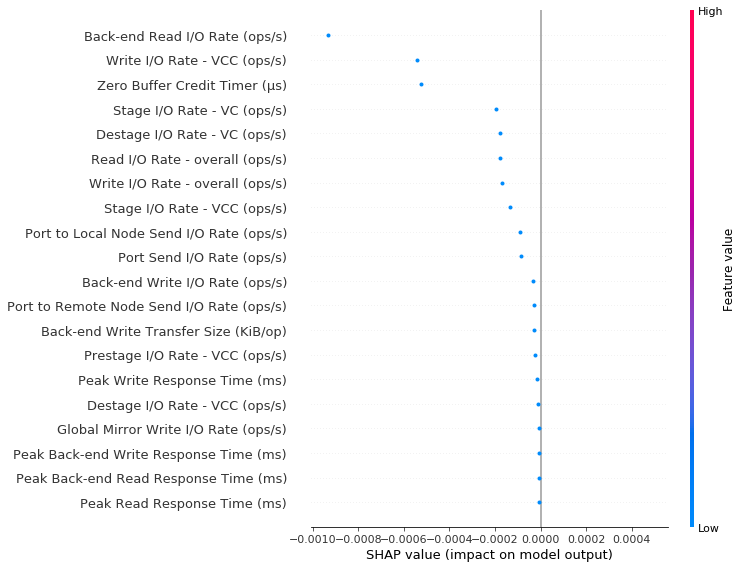

In [39]:
shap.summary_plot(average_cluster_shap_values, average_cluster_sample_values, feature_names=features_order_in_data, max_display=20)

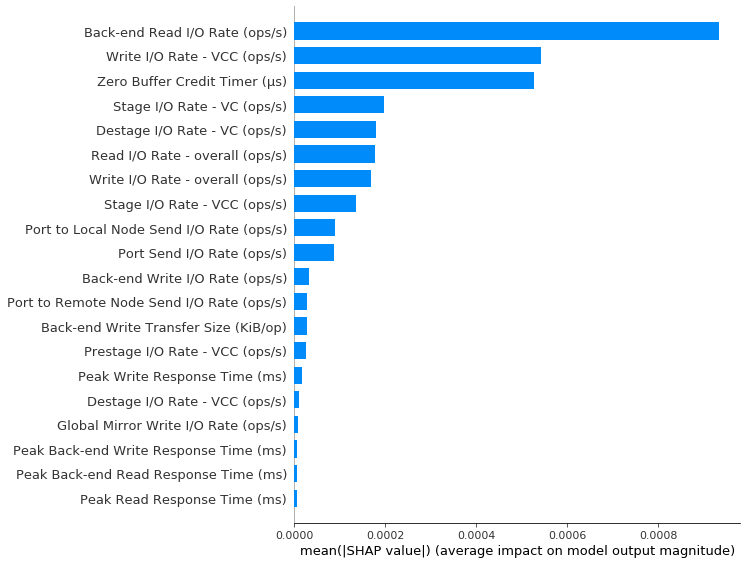

In [40]:
shap.summary_plot(average_cluster_shap_values, average_cluster_sample_values, feature_names=features_order_in_data, max_display=20, plot_type='bar')

## Cluster Plot Top 50

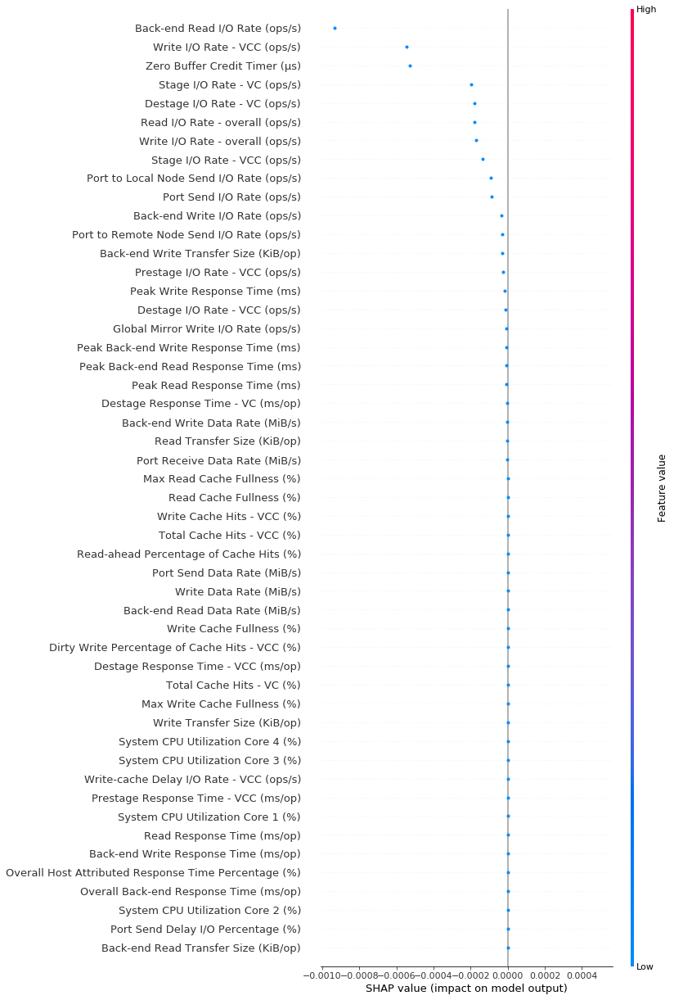

In [41]:
shap.summary_plot(average_cluster_shap_values, average_cluster_sample_values, feature_names=features_order_in_data, max_display=50)

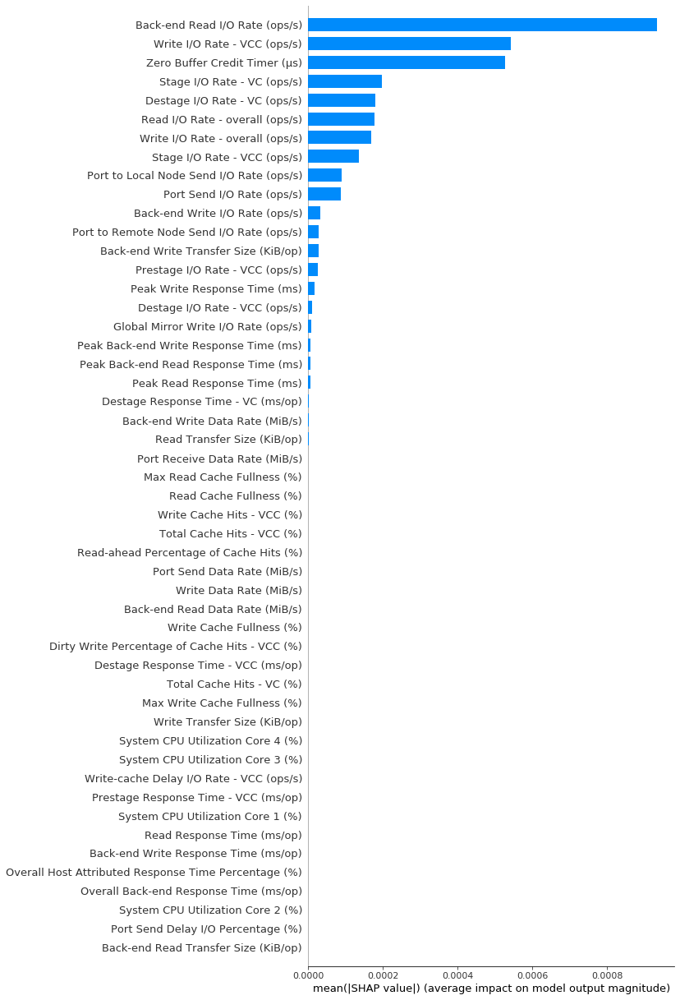

In [42]:
shap.summary_plot(average_cluster_shap_values, average_cluster_sample_values, feature_names=features_order_in_data, max_display=50, plot_type='bar')

# Temporal Explanations

In [43]:
shap_values_allFeatures = numpy.nanmean(shap_values, axis=1)
print(shap_values_allFeatures.shape)
print(shap_values_allFeatures)

(59, 1113)
[[ 3.73049991e-09 -4.80870681e-06 -1.19977420e-05 ...             nan
              nan             nan]
 [ 4.55699402e-08 -4.05272374e-06 -1.07800697e-05 ...             nan
              nan             nan]
 [-8.45032291e-09 -6.09516949e-06 -1.36144965e-05 ...             nan
              nan             nan]
 ...
 [-4.88592946e-06 -1.13691063e-05 -2.82076192e-05 ...             nan
              nan             nan]
 [-7.11753601e-06 -1.00801673e-05 -1.98832912e-05 ...             nan
              nan             nan]
 [-1.52810717e-06 -2.32657333e-06 -1.66534775e-05 ...             nan
              nan             nan]]


Mean of empty slice


## Categories

### Own Categories

### SME Categories

In [44]:
categories = pd.read_csv("grafana_tags.csv")
print(categories['entity'].unique())
print(categories['tag'].unique())

['StorageSystem' 'StoragePorts' 'Nodes' 'ManagedDisks' 'Volumes']
['Response Time Essential' 'Cause' 'Impact' 'Response Time Advanced'
 'Workload Basic' 'Front-end Basic']


In [45]:
impact = categories.loc[categories['tag'] == 'Impact']
impact = impact['metric'].tolist()
# check which of those features are in our feature list
impact = [i for i in impact if i in features_order_in_data]
impact

['Read Response Time (ms/op)',
 'Write Response Time (ms/op)',
 'Port to Local Node Send Response Time (ms/op)',
 'Port to Local Node Send Queue Time (ms/op)',
 'Port Send Delay I/O Percentage (%)',
 'Back-end Read Response Time (ms/op)',
 'Back-end Write Response Time (ms/op)',
 'Back-end Read Queue Time (ms/op)',
 'Back-end Write Queue Time (ms/op)',
 'Read Response Time (ms/op)',
 'Write Response Time (ms/op)']

In [46]:
cause = categories.loc[categories['tag'] == 'Cause']
cause = cause['metric'].tolist()
cause = [i for i in cause if i in features_order_in_data]
cause

['Read I/O Rate - overall (ops/s)',
 'Write I/O Rate - overall (ops/s)',
 'Write Data Rate (MiB/s)',
 'Read Transfer Size (KiB/op)',
 'Write Transfer Size (KiB/op)',
 'Peak Read Response Time (ms)',
 'Peak Write Response Time (ms)',
 'Back-end Read I/O Rate (ops/s)',
 'Back-end Write I/O Rate (ops/s)',
 'Back-end Read Data Rate (MiB/s)',
 'Back-end Write Data Rate (MiB/s)',
 'Back-end Read Transfer Size (KiB/op)',
 'Back-end Write Transfer Size (KiB/op)',
 'Peak Back-end Read Response Time (ms)',
 'Peak Back-end Write Response Time (ms)',
 'Read I/O Rate - overall (ops/s)',
 'Write I/O Rate - overall (ops/s)',
 'Write Data Rate (MiB/s)',
 'Read Transfer Size (KiB/op)',
 'Write Transfer Size (KiB/op)',
 'Peak Read Response Time (ms)',
 'Peak Write Response Time (ms)']

In [47]:
workload_basic = categories.loc[categories['tag'] == 'Workload Basic']
workload_basic = workload_basic['metric'].tolist()
workload_basic = [i for i in workload_basic if i in features_order_in_data]
workload_basic

['Back-end Read Data Rate (MiB/s)',
 'Back-end Read I/O Rate (ops/s)',
 'Back-end Read Response Time (ms/op)',
 'Back-end Write Data Rate (MiB/s)',
 'Back-end Write I/O Rate (ops/s)',
 'Back-end Write Response Time (ms/op)']

In [48]:
frontend_basic = categories.loc[categories['tag'] == 'Front-end Basic']
frontend_basic = frontend_basic['metric'].tolist()
frontend_basic = [i for i in frontend_basic if i in features_order_in_data]
frontend_basic

['Destage Response Time - VC (ms/op)',
 'Destage Response Time - VCC (ms/op)',
 'Read I/O Rate - overall (ops/s)',
 'Read Response Time (ms/op)',
 'Write Data Rate (MiB/s)',
 'Write I/O Rate - overall (ops/s)',
 'Write Response Time (ms/op)']

In [49]:
response_time_1 = categories.loc[categories['tag'] == 'Response Time Essential']
response_time_1 = response_time_1['metric'].tolist()
response_time_2 = categories.loc[categories['tag'] == 'Response Time Advanced']
response_time_2 = response_time_2['metric'].tolist()
response_time = response_time_1 + response_time_2
response_time = [i for i in response_time if i in features_order_in_data]
response_time

['Overall Host Attributed Response Time Percentage (%)',
 'Read Response Time (ms/op)',
 'Write Response Time (ms/op)',
 'Back-end Read Response Time (ms/op)',
 'Back-end Write Response Time (ms/op)',
 'Port to Local Node Send Response Time (ms/op)',
 'Port to Local Node Receive Response Time (ms/op)',
 'Destage Response Time - VC (ms/op)',
 'Destage Response Time - VCC (ms/op)',
 'Stage Response Time - VC (ms/op)',
 'Stage Response Time - VCC (ms/op)',
 'Prestage Response Time - VCC (ms/op)',
 'Cache to Host Transfer Response Time (ms/op)']

In [50]:
# features not belonging to any of the above categories
category_features = impact + cause + workload_basic + frontend_basic + response_time
print(len(category_features))
other = [i for i in features_order_in_data if i not in category_features]
print(len(other))
print(len(features_order_in_data))

59
52
84


In [51]:
def get_position_category_features(category_features, all_features_list):
    indices = []
    for feature in category_features:
        indices.append(all_features_list.index(feature))
    print(len(indices), indices)
    return indices

In [52]:
def get_samples_per_featureCategory(category_positions, dataset):
    category_data = []
    for x in dataset:
        anomaly = []
        for i in category_positions:
            anomaly.append(x[i])
        category_data.append(anomaly)
    category_data = numpy.array(category_data)
    print(category_data.shape)
    # average over features
    category_data = numpy.nanmean(category_data, axis=1)
    print(category_data.shape)
    return category_data

## Averaged over Feature categories: IO Rates, Response Time, Cache, Data Rates, Transfer, Others

In [53]:
position_impact = get_position_category_features(impact, features_order_in_data)

positions_cause = get_position_category_features(cause, features_order_in_data)

positions_workload_basic = get_position_category_features(workload_basic, features_order_in_data)

positions_frontend_basic = get_position_category_features(frontend_basic, features_order_in_data)

positions_response_time = get_position_category_features(response_time, features_order_in_data)

positions_other = get_position_category_features(other, features_order_in_data)

11 [12, 13, 30, 32, 78, 77, 83, 2, 3, 12, 13]
22 [6, 7, 10, 16, 17, 38, 39, 33, 44, 55, 66, 4, 5, 8, 42, 6, 7, 10, 16, 17, 38, 39]
6 [55, 33, 77, 66, 44, 83]
7 [65, 67, 6, 12, 10, 7, 13]
13 [41, 12, 13, 77, 83, 30, 31, 65, 67, 68, 69, 70, 71]
52 [0, 1, 9, 11, 14, 15, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 34, 35, 36, 37, 40, 43, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 56, 57, 58, 59, 60, 61, 62, 63, 64, 72, 73, 74, 75, 76, 79, 80, 81, 82]


In [54]:
impact_data = get_samples_per_featureCategory(position_impact, dataset)

cause_data = get_samples_per_featureCategory(positions_cause, dataset)

workload_basic_data = get_samples_per_featureCategory(positions_workload_basic, dataset)

frontend_basic_data = get_samples_per_featureCategory(positions_frontend_basic, dataset)

response_time_data = get_samples_per_featureCategory(positions_response_time, dataset)

other_data = get_samples_per_featureCategory(positions_other, dataset)

(59, 11, 1113)
(59, 1113)
(59, 22, 1113)
(59, 1113)
(59, 6, 1113)
(59, 1113)
(59, 7, 1113)
(59, 1113)
(59, 13, 1113)
(59, 1113)
(59, 52, 1113)
(59, 1113)


Mean of empty slice


More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


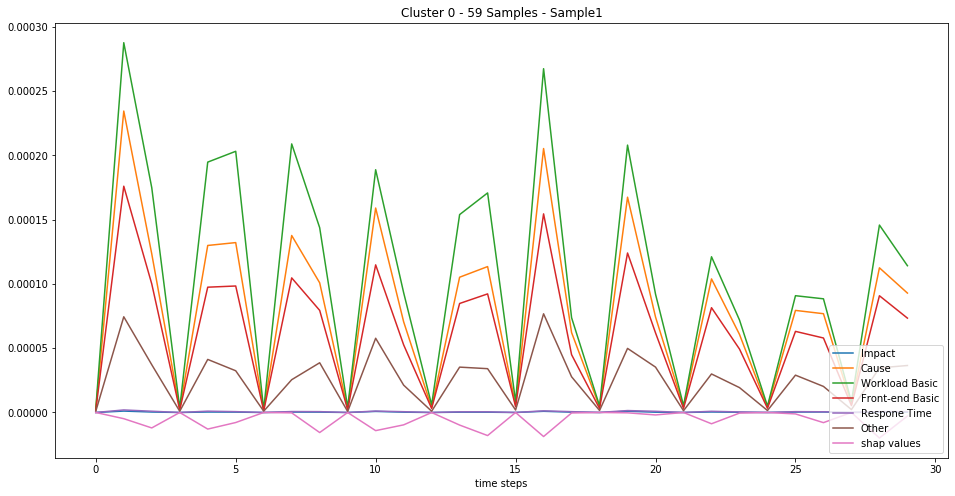

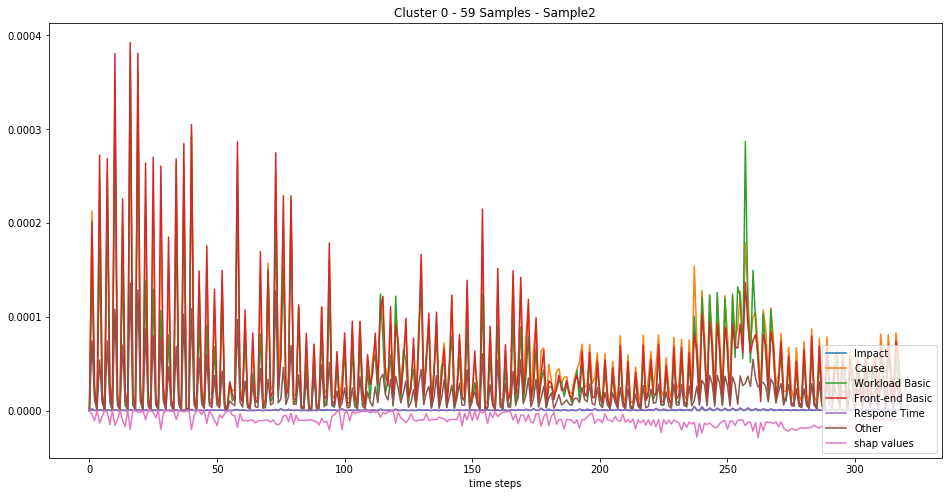

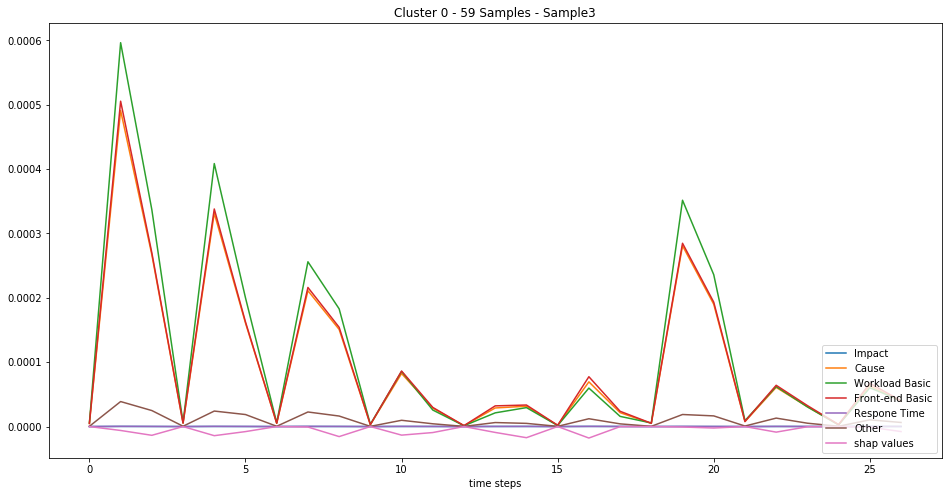

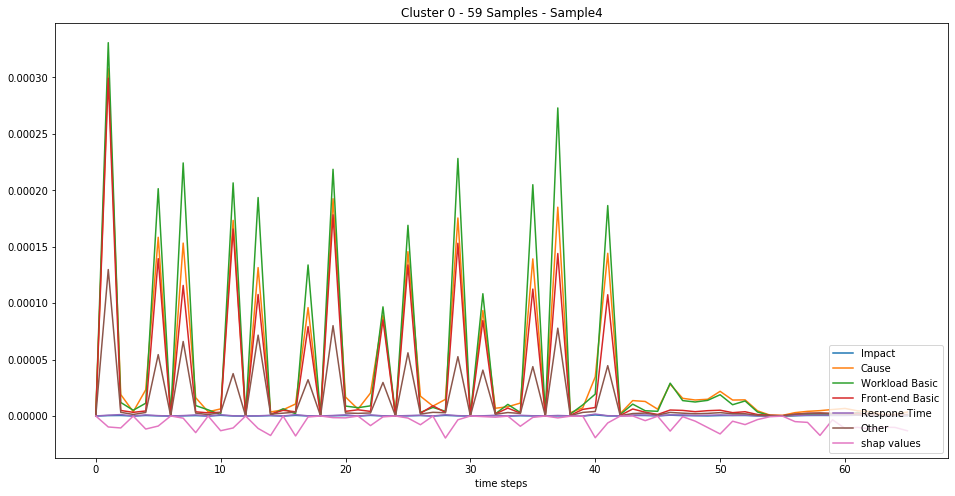

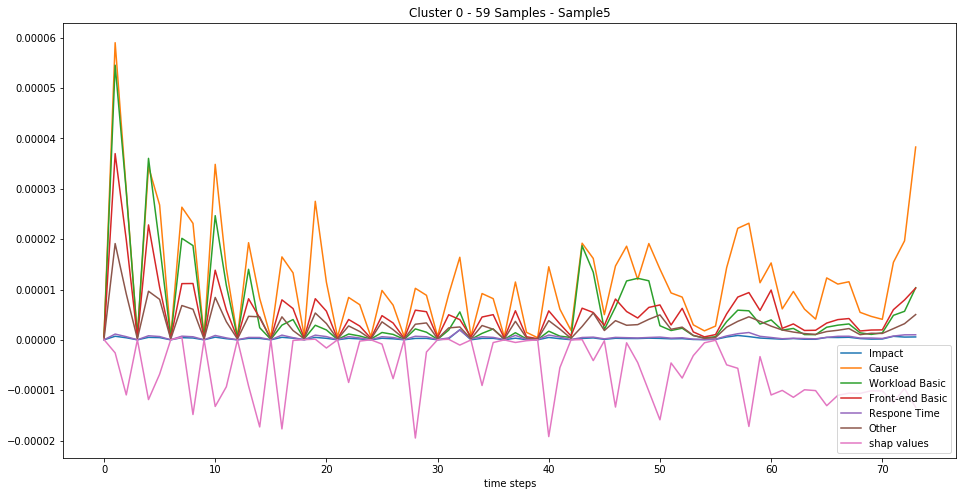

...

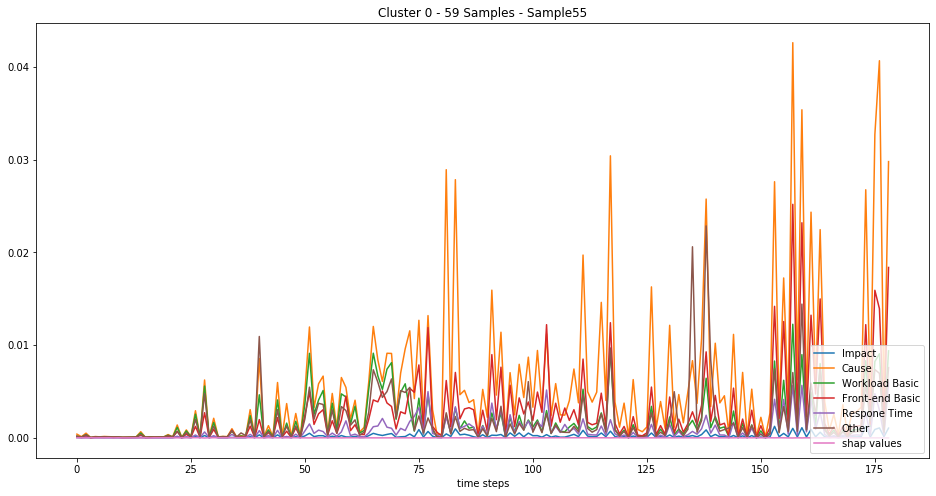

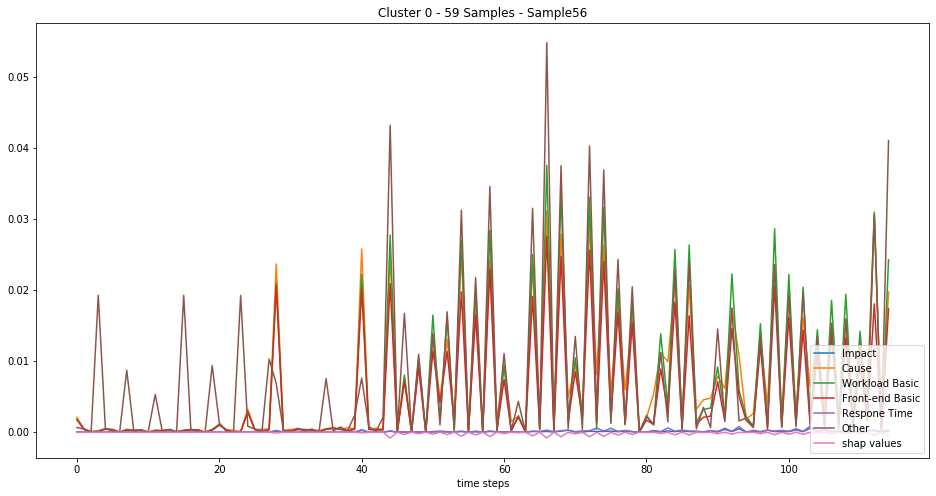

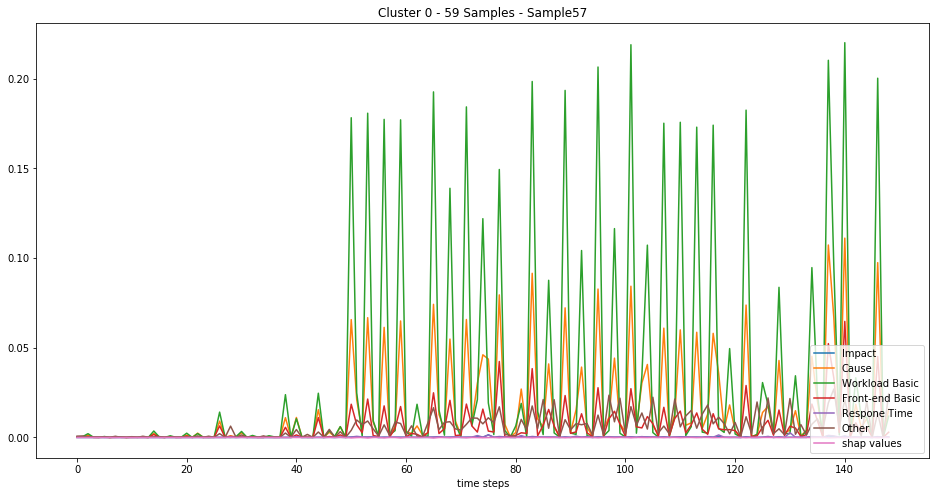

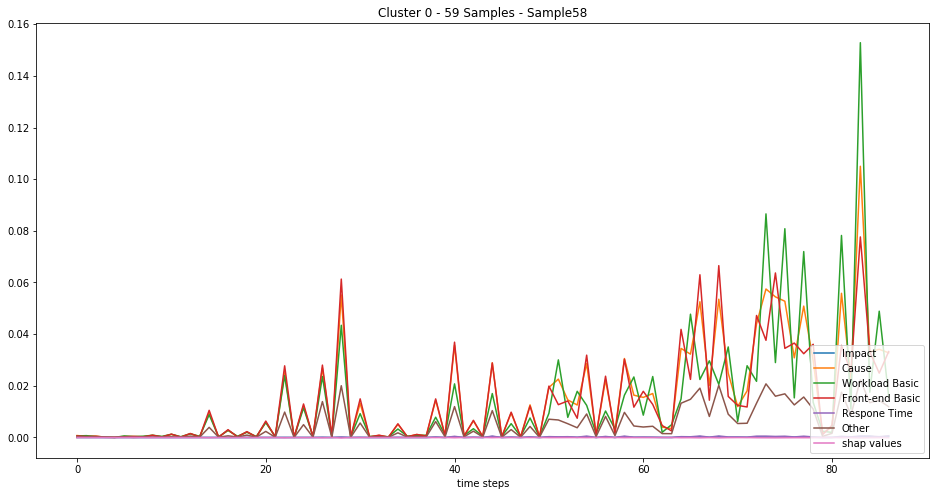

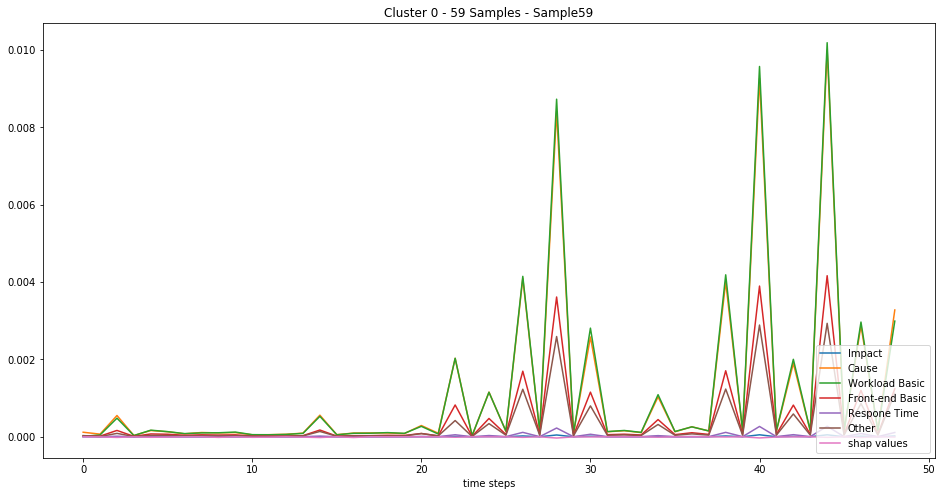

In [55]:
import matplotlib.pyplot as plt
for i in range(0,59):
    plt.figure(figsize=(16,8))
    
    plt.plot(impact_data[i],label="Impact")
    
    plt.plot(cause_data[i],label="Cause")
    
    plt.plot(workload_basic_data[i],label="Workload Basic")
    
    plt.plot(frontend_basic_data[i],label="Front-end Basic")
    
    plt.plot(response_time_data[i],label="Respone Time")
    
    plt.plot(other_data[i],label="Other")
    
    plt.plot(shap_values_allFeatures[i],label="shap values")
    
    plt.xlabel("time steps")
    
    plt.legend(loc="lower right")
    
    plt.title("Cluster 0 - 59 Samples - Sample"+str(i+1))
    
    plt.savefig('/home/sto/Plots/temporal_explanations_may03/cluster_0/cluster-0_59-samples_sample-' + str(i+1) + '.png')

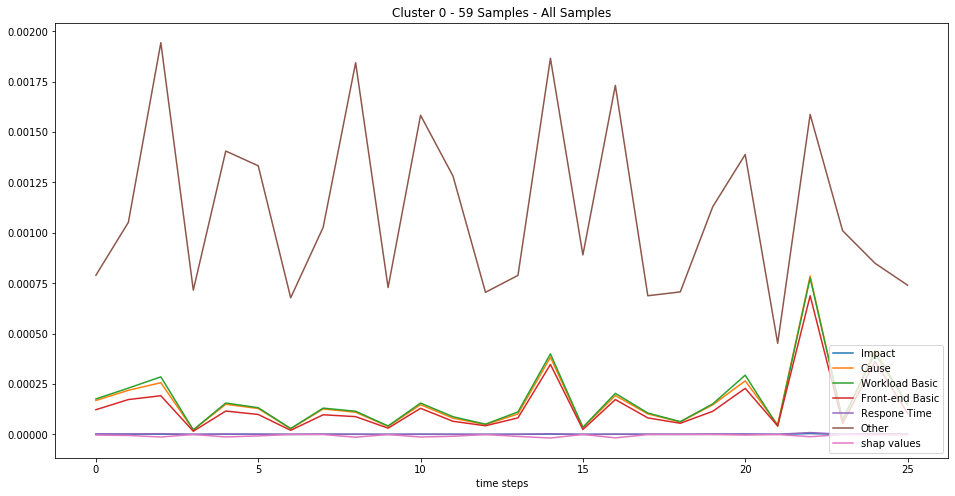

In [56]:
plt.figure(figsize=(16,8))
plt.plot(impact_data.mean(0),label="Impact")
plt.plot(cause_data.mean(0),label="Cause")
plt.plot(workload_basic_data.mean(0),label="Workload Basic")
plt.plot(frontend_basic_data.mean(0),label="Front-end Basic")
plt.plot(response_time_data.mean(0),label="Respone Time")
plt.plot(other_data.mean(0),label="Other")
plt.plot(shap_values_allFeatures.mean(0),label="shap values")
plt.xlabel("time steps")
plt.legend(loc="lower right")
plt.title("Cluster 0 - 59 Samples - All Samples")
plt.savefig('/home/sto/Plots/temporal_explanations_may03/cluster_0/cluster-0_59-samples_all-samples.png')

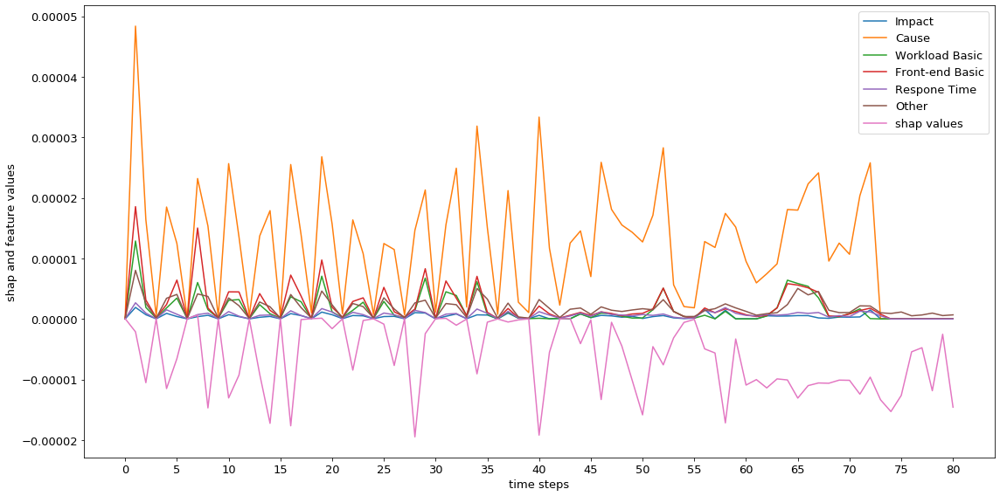

In [71]:
i = 22
import matplotlib.pyplot as plt
plt.figure(figsize=(16,8))
    
plt.plot(impact_data[i],label="Impact")
    
plt.plot(cause_data[i],label="Cause")
    
plt.plot(workload_basic_data[i],label="Workload Basic")
    
plt.plot(frontend_basic_data[i],label="Front-end Basic")
    
plt.plot(response_time_data[i],label="Respone Time")
    
plt.plot(other_data[i],label="Other")
    
plt.plot(shap_values_allFeatures[i],label="shap values")
    
plt.xlabel("time steps", fontsize=13)

plt.ylabel("shap and feature values",fontsize=13)

plt.rc('xtick', labelsize=13)

plt.rc('ytick', labelsize=13) 

plt.xticks(numpy.arange(0, 85, 5),fontsize=13)

plt.legend(loc="upper right", fontsize=13)

plt.tight_layout()

plt.savefig('/home/sto/Plots/temporal_explanations_may03/cluster_0/GOODONE.png')

plt.show()

# Zero Buffer Credit Timer weighted down more